<a href="https://colab.research.google.com/github/GiX7000/deep-learning-with-tensorflow/blob/main/Part12.VAEs%26GANs.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Deep Learning with TensorFlow with Laurence Moroney, Part12

## Example 1. A Variational Autoencoder on MNIST Dataset.

We will build a Variational Autoencoder (VAE) trained on the MNIST dataset and see how it is able to generate new images.

In [ ]:
import tensorflow as tf
import tensorflow_datasets as tfds
import matplotlib.pyplot as plt
from IPython import display

Prepare the dataset.

In [ ]:
# Define global constants to be used in this notebook
BATCH_SIZE=128
LATENT_DIM=2

# heper functions

def map_image(image, label):
  '''Returns a normalized and reshaped tensor from a given image'''
  image = tf.cast(image, dtype=tf.float32)
  image /= 255.0
  image = tf.reshape(image, shape=(28,28,1,))
  return image

def get_dataset(map_fn, is_validation=False):
  '''Loads and prepares the mnist dataset from TFDS'''
  if is_validation:
    split_name = "test"
  else:
    split_name = "train"
  
  dataset = tfds.load("mnist", as_supervised=True, split=split_name)
  dataset = dataset.map(map_fn)

  if is_validation:
    dataset = dataset.batch(BATCH_SIZE)
  else:
    dataset = dataset.shuffle(1024).batch(BATCH_SIZE)
  
  return dataset

In [ ]:
train_dataset = get_dataset(map_image)

Dl Completed...:   0%|          | 0/4 [00:00<?, ? file/s]

Dataset mnist downloaded and prepared to ~/tensorflow_datasets/mnist/3.0.1. Subsequent calls will reuse this data.


Build the model.

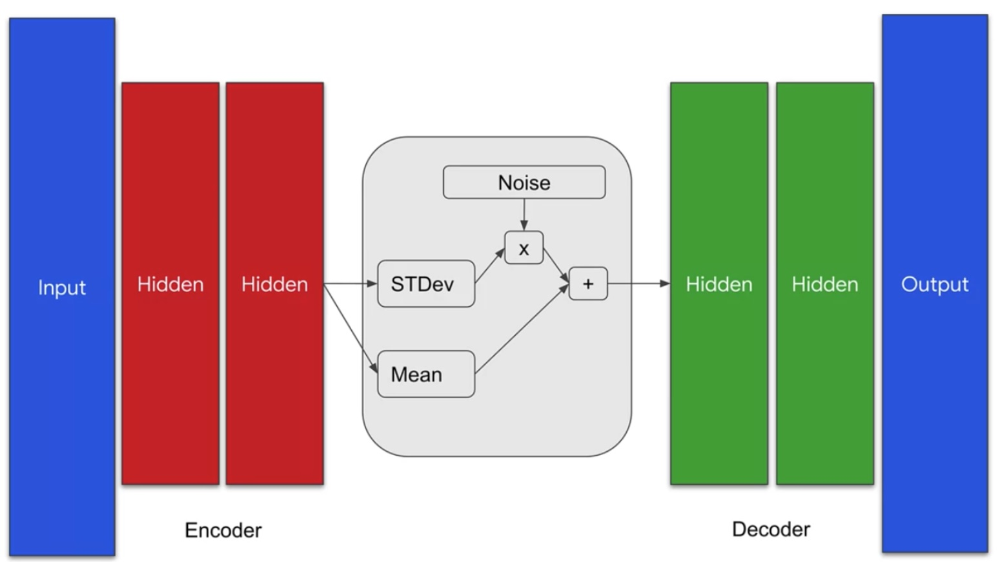

VAE also has an encoder-decoder architecture with the main difference being the grey box in the middle which stands for the latent representation. In this layer, the model mixes a random sample and combines it with the outputs of the encoder. This mechanism makes it useful for generating new content.

In [ ]:
# this will be a custom Keras layer that will provide the Gaussian noise input along with the mean (mu) and standard
# deviation (sigma) of the encoder's output
class Sampling(tf.keras.layers.Layer):
  def call(self, inputs):
    """Generates a random sample and combines with encoder output

    Args:
      inputs -- output tensor from the encoder

    Returns:
      `inputs` tensors combined with a random sample
    """

    # unpack the output of the encoder
    mu, sigma = inputs

    # get the size and dimensions of the batch
    batch = tf.shape(mu)[0]
    dim = tf.shape(mu)[1]

    # generate a random tensor
    epsilon = tf.keras.backend.random_normal(shape=(batch, dim))

    # combine the inputs and noise
    return mu + tf.exp(0.5 * sigma) * epsilon

Encoder.

In [ ]:
def encoder_layers(inputs, latent_dim):
  """Defines the encoder's layers
  Args:
    inputs -- batch from the dataset
    latent_dim -- dimensionality of the latent space
  
  Returns:
    mu -- learned mean
    sigma -- learned standard deviation
    batch_2.shape -- shape of the features before flattening
  """

  # add the Conv2D layers followed by BatchNormalization
  x = tf.keras.layers.Conv2D(filters=32, kernel_size=3, strides=2, padding="same", activation="relu", name="encode_conv1")(inputs)
  x = tf.keras.layers.BatchNormalization()(x)
  x = tf.keras.layers.Conv2D(filters=64, kernel_size=3, strides=2, padding="same", activation="relu", name="encoder_conv2")(x)

  # assign to a different variable so you can extract the shape later
  batch_2 = tf.keras.layers.BatchNormalization()(x) # will be useful when reconstructing the image later in the decoder


  # flatten the features and feed into the Dense network
  x = tf.keras.layers.Flatten(name="encode_flatten")(batch_2)

  # we arbitrarily used 20 units here but feel free to change and see what results you get
  x = tf.keras.layers.Dense(20, activation="relu", name="encoder_dense")(x)
  x = tf.keras.layers.BatchNormalization()(x)

  # add output Dense networks for mu and sigma, units equal to the declared latent_dim
  mu = tf.keras.layers.Dense(latent_dim, name="latent_mu")(x)
  sigma = tf.keras.layers.Dense(latent_dim, name="latent_sigma")(x)

  return mu, sigma, batch_2.shape

In [ ]:
def encoder_model(latent_dim, input_shape):
  """Defines the encoder model with the Sampling layer

  Args:
    latent_dim -- dimensionality of the latent space
    input_shape -- shape of the dataset batch

  Returns:
    model -- the encoder model
    conv_shape -- shape of the features before flattening
  """

  # declare the inputs tensor with the given shape
  inputs = tf.keras.layers.Input(shape=input_shape)

  # get the output of the encoder_layers() function
  mu, sigma, conv_shape = encoder_layers(inputs, latent_dim=LATENT_DIM)

  # feed mu and sigma to the sampling layer
  z = Sampling()((mu, sigma))

  # build the whole encoder model
  model = tf.keras.Model(inputs=inputs, outputs=[mu, sigma, z])

  return model, conv_shape

Decoder.

In [ ]:
def decoder_layers(inputs, conv_shape):
  """Defines the decoder layer
  Args:
    inputs -- output of the decoder
    conv_shape -- shape of the features before flattening

  Returns:
    tensor containing the decoded output
  """

  # feed to a Dense network with units computed from the conv_shape dimensions
  units = conv_shape[1] * conv_shape[2] * conv_shape[3]
  x = tf.keras.layers.Dense(units, activation="relu", name="decode_dense1")(inputs)
  x = tf.keras.layers.BatchNormalization()(x)

  # reshape output using the conv_shape dimensions
  x = tf.keras.layers.Reshape((conv_shape[1], conv_shape[2], conv_shape[3]), name="decode_reshape")(x)

  # upsample the features back to the original dimensions
  x = tf.keras.layers.Conv2DTranspose(filters=64, kernel_size=3, strides=2, padding="same", activation="relu", name="decode_conv2d_2")(x)
  x = tf.keras.layers.BatchNormalization()(x)
  x = tf.keras.layers.Conv2DTranspose(filters=32, kernel_size=3, strides=2, padding="same", activation="relu", name="decode_conv2d_3")(x)
  x =tf.keras.layers.BatchNormalization()(x)
  x = tf.keras.layers.Conv2DTranspose(filters=1, kernel_size=3, strides=1, padding="same", activation="sigmoid", name="decode_final")(x)

  return x

In [ ]:
def decoder_model(latent_dim, conv_shape):
  """Defines the decoder model

  Args:
    latent_dim -- dimensionality of the latent space
    conv_shape -- shape of the features before flattening
  
  Returns:
    model -- the decoder model
  """

  # set the inputs to the shape of the latent space
  inputs = tf.keras.layers.Input(shape=(latent_dim,))

  # get the output of the decoder layers
  outputs = decoder_layers(inputs, conv_shape)

  # declare the inputs and outputs of the model
  model = tf.keras.Model(inputs, outputs)

  return model

In [ ]:
# Kullback–Leibler Divergence: to improve the generative capability of the model, we have to take into account the random normal
# distribution introduced in the latent space. For that, the Kullback–Leibler Divergence is computed and added to the reconstruction loss

def kl_reconstruction_loss(inputs, outputs, mu, sigma):
  """Computes the Kullback-Leibler Divergence (KLD)
  
  Args:
    inputs -- batch from the dataset
    outputs -- batch from the sampling layer
    mu -- mean
    sigma -- standard deviation
  
  Returns
    KLD loss
  """
  # honestly, to truly understand this loss is challenging to me
  kl_loss = 1 + sigma - tf.square(mu) - tf.math.exp(sigma)
  kl_loss = tf.reduce_mean(kl_loss) * - 0.5

  return kl_loss

VAE Model.

In [ ]:
def vae_model(encoder, decoder, input_shape):
  """Defines the VAE model
  Args:
    encoder -- the encoder model
    decoder -- the decoder model
    input_shape -- shape of the dataset batch

  Returns:
    the complete VAE model
  """

  # set the inputs
  inputs = tf.keras.layers.Input(shape=input_shape)

  # get mu, sigma, and z from the encoder output
  mu, sigma, z = encoder(inputs)

  # get reconstructed output from the encoder
  reconstructed = decoder(z)

  # define the inputs and outputs to the VAE
  model = tf.keras.Model(inputs=inputs, outputs=reconstructed)

  # add the KL loss
  loss = kl_reconstruction_loss(inputs, z, mu, sigma)
  model.add_loss(loss)

  return model

In [ ]:
# helper function to setup and get the different models from the above functions

def get_models(input_shape, latent_dim):
  """Returns the encoder, decoder, and vae models"""
  encoder, conv_shape = encoder_model(latent_dim=latent_dim, input_shape=input_shape)
  decoder = decoder_model(latent_dim=latent_dim, conv_shape=conv_shape)
  vae = vae_model(encoder, decoder, input_shape=input_shape)
  return encoder, decoder, vae

In [ ]:
# Get the encoder, decoder and 'master' model (called vae)
encoder, decoder, vae = get_models(input_shape=(28,28,1,), latent_dim=LATENT_DIM)

Train the model.

In [ ]:
# Define our loss functions and optimizers
optimizer = tf.keras.optimizers.Adam()
loss_metric = tf.keras.metrics.Mean()
bce_loss = tf.keras.losses.BinaryCrossentropy()

In [ ]:
# we want to see the progress of the image generation at each epoch. For that, we can use the helper function below, which generates
# 16 images in a 4x4 grid

def generate_and_save_images(model, epoch, step, test_input):
  """Helper function to plot our 16 images

  Args:

  model -- the decoder model
  epoch -- current epoch number during training
  step -- current step number during training
  test_input -- random tensor with shape (16, LATENT_DIM)
  """

  # generate images from the test input
  predictions = model.predict(test_input)

  # plot the results
  fig = plt.figure(figsize=(4,4))

  for i in range(predictions.shape[0]):
      plt.subplot(4, 4, i+1)
      plt.imshow(predictions[i, :, :, 0], cmap='gray')
      plt.axis('off')

  # tight_layout minimizes the overlap between 2 sub-plots
  fig.suptitle("epoch: {}, step: {}".format(epoch, step))
  plt.savefig('image_at_epoch_{:04d}_step{:04d}.png'.format(epoch, step))
  plt.show()

1/1 [==============================] - 0s 16ms/step


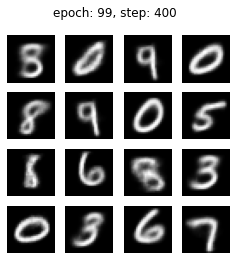

Epoch: 99 step: 400 mean loss = 142.08788


In [ ]:
# Training loop

# generate random vector as test input to the decoder
random_vector_for_generation = tf.random.normal(shape=[16, LATENT_DIM])

# number of epochs
epochs = 100

# initialize the helper function to display outputs from an untrained model
generate_and_save_images(decoder, 0, 0, random_vector_for_generation)

for epoch in range(epochs):
  print('Start of epoch %d' % (epoch, ))

  # iterate over the batches of the dataset
  for step, x_batch_train in enumerate(train_dataset):
    with tf.GradientTape() as tape:
      # feed a batch to the VAE model
      reconstructed = vae(x_batch_train)

      # compute reconstruction loss
      flattened_inputs = tf.reshape(x_batch_train, shape=[-1])
      flattened_outputs = tf.reshape(reconstructed, shape=[-1])
      loss = bce_loss(flattened_inputs, flattened_outputs) * 784  # image size (28 * 28 * 1)
      
      # add KLD regularization loss to the binary crossentropy loss before we get the gradients and update the weights
      loss += sum(vae.losses)

    # get the gradients and update the weights
    grads = tape.gradient(loss, vae.trainable_weights)
    optimizer.apply_gradients(zip(grads, vae.trainable_weights))

    # compute the loss metric
    loss_metric(loss)   

    # display outputs every 100 steps
    if step % 100 == 0:
      display.clear_output(wait=False)
      generate_and_save_images(decoder, epoch, step, random_vector_for_generation)
      print('Epoch: %s step: %s mean loss = %s' % (epoch, step, loss_metric.result().numpy()))
     

Create Gifs.

In [ ]:
import zipfile
import glob
# create gifs
zipf = zipfile.ZipFile('./vea.zip', 'w', zipfile.ZIP_DEFLATED)

filenames = glob.glob('./content/image_at_epoch_*.png')
filenames = sorted(filenames)

for filename in filenames:
    zipf.write(filename)

zipf.close()

In [ ]:
import imageio

imageio.plugins.freeimage.download()

!rm -rf ./results/vea-mnist-anim.gif

anim_file = './vea-mnist-anim.gif'

filenames = glob.glob('/content/image_at_epoch_*.png')
filenames = sorted(filenames)
last = -1
images = []

for filename in filenames:
    image = imageio.imread(filename)
    images.append(image)

imageio.mimsave(anim_file, images, 'GIF-FI', fps=10)

## Example 2. A Variational Autoencoder (VAE) on the Anime Faces Dataset by MckInsey666.

We will use the same model as in example 1 on a different dataset.

In [ ]:
import tensorflow as tf
import tensorflow_datasets as tfds

import matplotlib.pyplot as plt
import numpy as np

import os
import zipfile
import urllib.request
import random
from IPython import display

Download and prepare the dataset.

In [ ]:
# set a random seed
np.random.seed(51)

# parameters for building the model and training
BATCH_SIZE=2000
LATENT_DIM=512
IMAGE_SIZE=64

# make the data directory
try:
  os.mkdir('/tmp/anime')
except OSError:
  pass

# download the zipped dataset to the data directory
data_url = "https://storage.googleapis.com/laurencemoroney-blog.appspot.com/Resources/anime-faces.zip"
data_file_name = "animefaces.zip"
download_dir = '/tmp/anime/'
urllib.request.urlretrieve(data_url, data_file_name)

# extract the zip file
zip_ref = zipfile.ZipFile(data_file_name, 'r')
zip_ref.extractall(download_dir)
zip_ref.close()

In [ ]:
# Data Preparation Utilities

def get_dataset_slice_paths(image_dir):
  '''returns a list of paths to the image files'''
  image_file_list = os.listdir(image_dir)
  image_paths = [os.path.join(image_dir, fname) for fname in image_file_list]

  return image_paths


def map_image(image_filename):
  '''preprocesses the images'''
  img_raw = tf.io.read_file(image_filename)
  image = tf.image.decode_jpeg(img_raw)

  image = tf.cast(image, dtype=tf.float32)
  image = tf.image.resize(image, (IMAGE_SIZE, IMAGE_SIZE))
  image = image / 255.0  
  image = tf.reshape(image, shape=(IMAGE_SIZE, IMAGE_SIZE, 3,))

  return image

In [ ]:
# generate the train and validation sets

# get the list containing the image paths
paths = get_dataset_slice_paths("/tmp/anime/images/")

# shuffle the paths
random.shuffle(paths)

# split the paths list into to training (80%) and validation sets(20%).
paths_len = len(paths)
train_paths_len = int(paths_len * 0.8)

train_paths = paths[:train_paths_len]
val_paths = paths[train_paths_len:]

# load the training image paths into tensors, create batches and shuffle
training_dataset = tf.data.Dataset.from_tensor_slices((train_paths))
training_dataset = training_dataset.map(map_image)
training_dataset = training_dataset.shuffle(1000).batch(BATCH_SIZE)

# load the validation image paths into tensors and create batches
validation_dataset = tf.data.Dataset.from_tensor_slices((val_paths))
validation_dataset = validation_dataset.map(map_image)
validation_dataset = validation_dataset.batch(BATCH_SIZE)


print(f'number of batches in the training set: {len(training_dataset)}')
print(f'number of batches in the validation set: {len(validation_dataset)}')

number of batches in the training set: 26
number of batches in the validation set: 7


In [ ]:
# utilities to help in visualizing the data

def display_faces(dataset, size=9):
  '''Takes a sample from a dataset batch and plots it in a grid.'''
  dataset = dataset.unbatch().take(size)
  n_cols = 3
  n_rows = size//n_cols + 1
  plt.figure(figsize=(5, 5))
  i = 0
  for image in dataset:
    i += 1
    disp_img = np.reshape(image, (64,64,3))
    plt.subplot(n_rows, n_cols, i)
    plt.xticks([])
    plt.yticks([])
    plt.imshow(disp_img)


def display_one_row(disp_images, offset, shape=(28, 28)):
  '''Displays a row of images.'''
  for idx, image in enumerate(disp_images):
    plt.subplot(3, 10, offset + idx + 1)
    plt.xticks([])
    plt.yticks([])
    image = np.reshape(image, shape)
    plt.imshow(image)


def display_results(disp_input_images, disp_predicted):
  '''Displays input and predicted images.'''
  plt.figure(figsize=(15, 5))
  display_one_row(disp_input_images, 0, shape=(IMAGE_SIZE,IMAGE_SIZE,3))
  display_one_row(disp_predicted, 20, shape=(IMAGE_SIZE,IMAGE_SIZE,3))

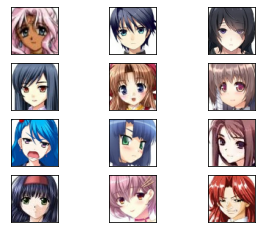

In [ ]:
# see some of the anime faces from the validation dataset
display_faces(validation_dataset, size=12)

Build the model: the same architecture as the model in example 1.

Encoder.

In [ ]:
class Sampling(tf.keras.layers.Layer):
  def call(self, inputs):
    """Generates a random sample and combines with the encoder output
    
    Args:
      inputs -- output tensor from the encoder

    Returns:
      `inputs` tensors combined with a random sample
    """
    mu, sigma = inputs
    batch = tf.shape(sigma)[0]
    dim = tf.shape(sigma)[1]
    epsilon = tf.keras.backend.random_normal(shape=(batch, dim))
    z = mu + tf.exp(0.5 * sigma) * epsilon
    return  z

In [ ]:
def encoder_layers(inputs, latent_dim):
  """Defines the encoder's layers.
  Args:
    inputs -- batch from the dataset
    latent_dim -- dimensionality of the latent space

  Returns:
    mu -- learned mean
    sigma -- learned standard deviation
    batch_3.shape -- shape of the features before flattening
  """
  
  # first block conv2D
  x = tf.keras.layers.Conv2D(filters=32, kernel_size=3, strides=2, padding="same", activation="relu", name="encode_conv1")(inputs)
  x = tf.keras.layers.BatchNormalization()(x)
  # second block conv2D
  x = tf.keras.layers.Conv2D(filters=64, kernel_size=3, strides=2, padding="same", activation="relu", name="encoder_conv2")(x)
  x = tf.keras.layers.BatchNormalization()(x)
  # third block conv2D
  x = tf.keras.layers.Conv2D(filters=128, kernel_size=3, strides=2, padding="same", activation="relu", name="encoder_conv3")(x)
  batch_3 = tf.keras.layers.BatchNormalization()(x)

  # flatten the output of the third conv2D
  x = tf.keras.layers.Flatten()(batch_3)

  # Dense layer
  x = tf.keras.layers.Dense(1024, activation="relu", name="encoder_dense")(x)
  x = tf.keras.layers.BatchNormalization()(x)

  # get the mu and sigma 
  mu = tf.keras.layers.Dense(latent_dim, name="latent_mu")(x)
  sigma = tf.keras.layers.Dense(latent_dim, name="latent_sigma")(x)

  # revise `batch_3.shape` here if you opted not to use 3 Conv2D layers
  return mu, sigma, batch_3.shape

In [ ]:
def encoder_model(latent_dim, input_shape):
  """Defines the encoder model with the Sampling layer
  Args:
    latent_dim -- dimensionality of the latent space
    input_shape -- shape of the dataset batch

  Returns:
    model -- the encoder model
    conv_shape -- shape of the features before flattening
  """
  inputs = tf.keras.layers.Input(shape=input_shape)
  mu, sigma, conv_shape = encoder_layers(inputs, latent_dim=LATENT_DIM)
  z = Sampling()((mu, sigma))
  model = tf.keras.Model(inputs=inputs, outputs=[mu, sigma, z])
  
  model.summary()
  return model, conv_shape

Decoder.

In [ ]:
def decoder_layers(inputs, conv_shape):
  """Defines the decoder layers.
  Args:
    inputs -- output of the encoder 
    conv_shape -- shape of the features before flattening

  Returns:
    tensor containing the decoded output
  """
  units = conv_shape[1] * conv_shape[2] * conv_shape[3]
  x = tf.keras.layers.Dense(units, activation="relu", name="decode_dense1")(inputs)
  x = tf.keras.layers.BatchNormalization()(x)

  # reshape output using the conv_shape dimensions
  x = tf.keras.layers.Reshape((conv_shape[1], conv_shape[2], conv_shape[3]), name="decode_reshape")(x)

  # first Conv2DTranspose
  x = tf.keras.layers.Conv2DTranspose(filters=128, kernel_size=3, strides=2, padding="same", activation="relu", name="decode_conv2d_1")(x)
  x = tf.keras.layers.BatchNormalization()(x)
  # second Conv2DTranspose
  x = tf.keras.layers.Conv2DTranspose(filters=64, kernel_size=3, strides=2, padding="same", activation="relu", name="decode_conv2d_2")(x)
  x = tf.keras.layers.BatchNormalization()(x)

  # third Conv2DTranspose
  x = tf.keras.layers.Conv2DTranspose(filters=32, kernel_size=3, strides=2, padding="same", activation="relu", name="decode_conv2d_3")(x)
  x = tf.keras.layers.BatchNormalization()(x)
  
  # last Conv2DTranspose
  x = tf.keras.layers.Conv2DTranspose(filters=3, kernel_size=3, strides=1, padding="same", activation="sigmoid", name="decode_conv2d_final")(x)
  x = tf.keras.layers.BatchNormalization()(x)
  return x

In [ ]:
def decoder_model(latent_dim, conv_shape):
  """Defines the decoder model.
  Args:
    latent_dim -- dimensionality of the latent space
    conv_shape -- shape of the features before flattening

  Returns:
    model -- the decoder model
  """
  inputs = tf.keras.layers.Input(shape=(latent_dim,))
  outputs = decoder_layers(inputs, conv_shape)
  model = tf.keras.Model(inputs=inputs, outputs=outputs)
  
  model.summary()
  return model

In [ ]:
# Kullback–Leibler Divergence
def kl_reconstruction_loss(inputs, outputs, mu, sigma):
  """ Computes the Kullback-Leibler Divergence (KLD)
  Args:
    inputs -- batch from the dataset
    outputs -- output of the Sampling layer
    mu -- mean
    sigma -- standard deviation

  Returns:
    KLD loss
  """
  kl_loss = 1 + sigma - tf.square(mu) - tf.math.exp(sigma)
  return tf.reduce_mean(kl_loss) * -0.5

VAE model.

In [ ]:
def vae_model(encoder, decoder, input_shape):
  """Defines the VAE model
  Args:
    encoder -- the encoder model
    decoder -- the decoder model
    input_shape -- shape of the dataset batch

  Returns:
    the complete VAE model
  """  
  inputs = tf.keras.layers.Input(shape=input_shape)

  # get mu, sigma, and z from the encoder output
  mu, sigma, z = encoder(inputs)

  # get reconstructed output from the encoder
  reconstructed = decoder(z)

  # define the inputs and outputs to the VAE
  model = tf.keras.Model(inputs=inputs, outputs=reconstructed)

  # add the KL loss
  loss = kl_reconstruction_loss(inputs, z, mu, sigma)
  model.add_loss(loss)

  return model

In [ ]:
def get_models(input_shape, latent_dim):
  """Returns the encoder, decoder, and vae models"""
  encoder, conv_shape = encoder_model(latent_dim, input_shape)
  decoder = decoder_model(latent_dim, conv_shape)
  vae = vae_model(encoder, decoder, input_shape)
  return encoder, decoder, vae

In [ ]:
# get the models we need for the training loop
encoder, decoder, vae = get_models(input_shape=(64,64,3,), latent_dim=LATENT_DIM)

Model: "model_3"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_4 (InputLayer)           [(None, 64, 64, 3)]  0           []                               
                                                                                                  
 encode_conv1 (Conv2D)          (None, 32, 32, 32)   896         ['input_4[0][0]']                
                                                                                                  
 batch_normalization_6 (BatchNo  (None, 32, 32, 32)  128         ['encode_conv1[0][0]']           
 rmalization)                                                                                     
                                                                                                  
 encoder_conv2 (Conv2D)         (None, 16, 16, 64)   18496       ['batch_normalization_6[0][

Train the model.

In [ ]:
optimizer = tf.keras.optimizers.Adam(learning_rate=0.003)
loss_metric = tf.keras.metrics.Mean()
mse_loss = tf.keras.losses.MeanSquaredError()
bce_loss = tf.keras.losses.BinaryCrossentropy()

In [ ]:
def generate_and_save_images(model, epoch, step, test_input):
  """Helper function to plot our 16 images

  Args:

  model -- the decoder model
  epoch -- current epoch number during training
  step -- current step number during training
  test_input -- random tensor with shape (16, LATENT_DIM)
  """
  predictions = model.predict(test_input)

  fig = plt.figure(figsize=(4,4))

  for i in range(predictions.shape[0]):
      plt.subplot(4, 4, i+1)
      img = predictions[i, :, :, :] * 255
      img = img.astype('int32')
      plt.imshow(img)
      plt.axis('off')

  # tight_layout minimizes the overlap between 2 sub-plots
  fig.suptitle("epoch: {}, step: {}".format(epoch, step))
  plt.savefig('image_at_epoch_{:04d}_step{:04d}.png'.format(epoch, step))
  plt.show()

1/1 [==============================] - 0s 18ms/step


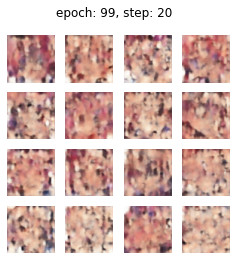

Epoch: 99 step: 20 mean loss = 251.80988
Epoch: 99 step: 21 mean loss = 251.77417
Epoch: 99 step: 22 mean loss = 251.73802
Epoch: 99 step: 23 mean loss = 251.7028
Epoch: 99 step: 24 mean loss = 251.66588
Epoch: 99 step: 25 mean loss = 251.62793


In [ ]:
# Training loop. Display generated images each epoch
epochs = 100

random_vector_for_generation = tf.random.normal(shape=[16, LATENT_DIM])
generate_and_save_images(decoder, 0, 0, random_vector_for_generation)

for epoch in range(epochs):
  print('Start of epoch %d' % (epoch,))

  # Iterate over the batches of the dataset.
  for step, x_batch_train in enumerate(training_dataset):
    with tf.GradientTape() as tape:

      reconstructed = vae(x_batch_train)
      # Compute reconstruction loss
      flatten_inputs = tf.reshape(x_batch_train, shape=[-1])
      flatten_outputs = tf.reshape(reconstructed, shape=[-1])

      loss = mse_loss(flatten_inputs, flatten_outputs) * 12288 # (64x64x3)
      loss += sum(vae.losses)
      
    grads = tape.gradient(loss, vae.trainable_weights)
    optimizer.apply_gradients(zip(grads, vae.trainable_weights))
    
    loss_metric(loss)

    if step % 10 == 0:
      display.clear_output(wait=False)    
      generate_and_save_images(decoder, epoch, step, random_vector_for_generation)
    print('Epoch: %s step: %s mean loss = %s' % (epoch, step, loss_metric.result().numpy()))

Plot Reconstructed Images.

We can get a glimpse of how our model is doing with the code block below. It feeds in a batch from the test set and plots a row of input (top) and output (bottom) images. It will look like something:

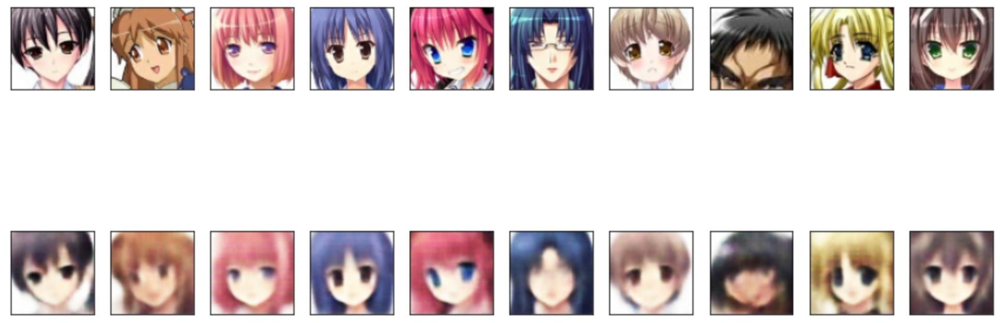

1/1 [==============================] - 3s 3s/step


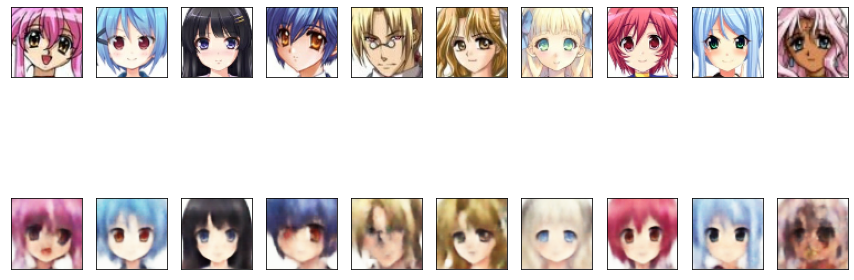

In [ ]:
test_dataset = validation_dataset.take(1)
output_samples = []

for input_image in tfds.as_numpy(test_dataset):
      output_samples = input_image

idxs = np.random.choice(64, size=10)

vae_predicted = vae.predict(test_dataset)
display_results(output_samples[idxs], vae_predicted[idxs])

Plot Generated Images.

Using the default parameters, it can take a long time to train our model well enough to generate good fake anime faces. In case we decide to experiment, the code block below displays an 8x8 gallery of fake data generated from our model. Here is a sample gallery generated after 50 epochs.

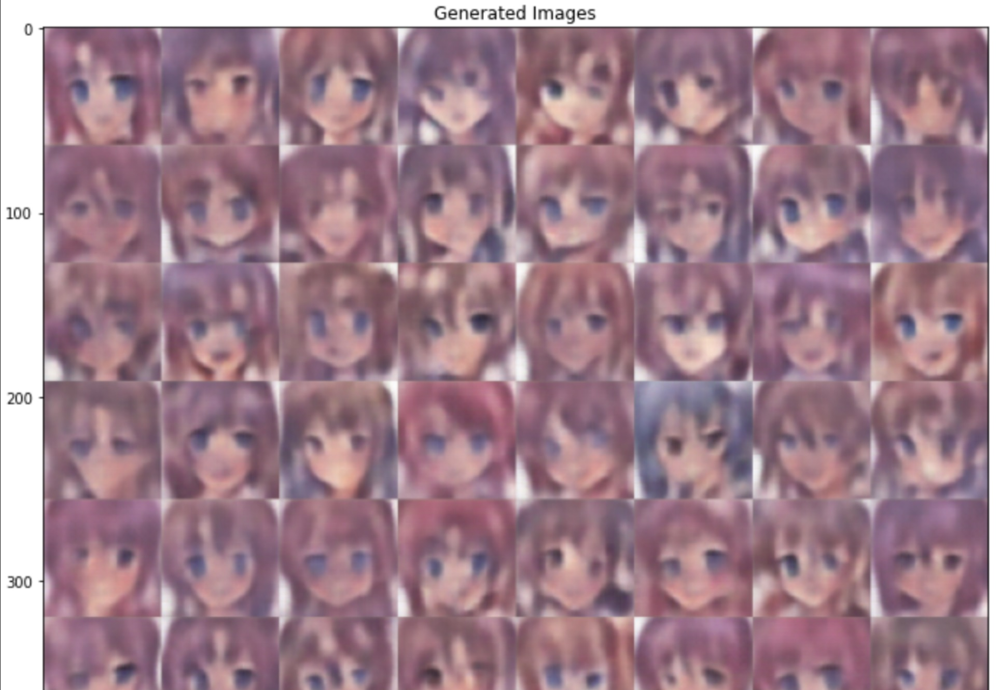

2/2 [==============================] - 0s 6ms/step


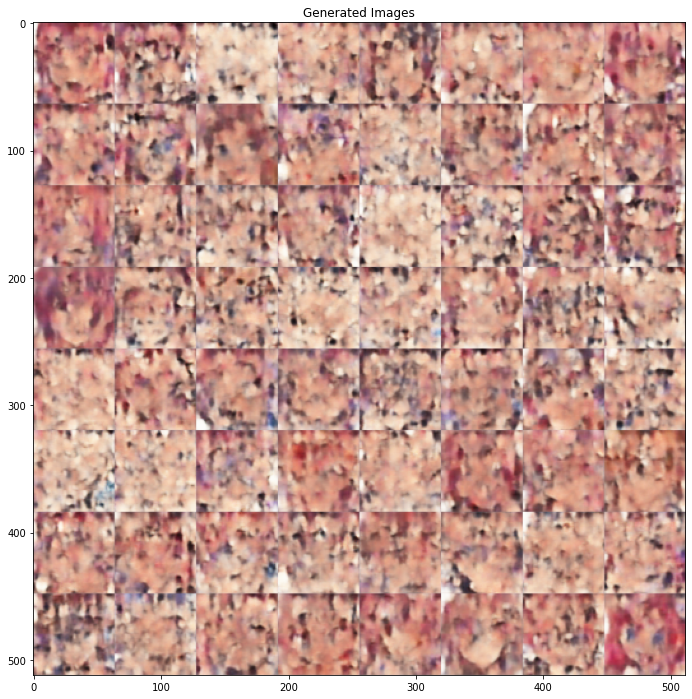

In [ ]:
def plot_images(rows, cols, images, title):
    '''Displays images in a grid.'''
    grid = np.zeros(shape=(rows*64, cols*64, 3))
    for row in range(rows):
        for col in range(cols):
            grid[row*64:(row+1)*64, col*64:(col+1)*64, :] = images[row*cols + col]

    plt.figure(figsize=(12,12))       
    plt.imshow(grid)
    plt.title(title)
    plt.show()

# initialize random inputs
test_vector_for_generation = tf.random.normal(shape=[64, LATENT_DIM])

# get predictions from the decoder model
predictions= decoder.predict(test_vector_for_generation)

# plot the predictions
plot_images(8,8,predictions,'Generated Images')

In [ ]:
# save the model
vae.save("anime.h5")

Create Gifs.

In [ ]:
import zipfile
import glob
# create gifs
zipf = zipfile.ZipFile('./vea.zip', 'w', zipfile.ZIP_DEFLATED)

filenames = glob.glob('./content/image_at_epoch_*.png')
filenames = sorted(filenames)

for filename in filenames:
    zipf.write(filename)

zipf.close()

In [ ]:
import imageio

imageio.plugins.freeimage.download()

!rm -rf ./results/vea-mnist-anim.gif

anim_file = './vea-anime-anim.gif'

filenames = glob.glob('/content/image_at_epoch_*.png')
filenames = sorted(filenames)
last = -1
images = []

for filename in filenames:
    image = imageio.imread(filename)
    images.append(image)

imageio.mimsave(anim_file, images, 'GIF-FI', fps=10)

Imageio: 'libfreeimage-3.16.0-linux64.so' was not found on your computer; downloading it now.
Try 1. Download from https://github.com/imageio/imageio-binaries/raw/master/freeimage/libfreeimage-3.16.0-linux64.so (4.6 MB)
Downloading: 8192/4830080 bytes (0.2%)4830080/4830080 bytes (100.0%)
  Done
File saved as /root/.imageio/freeimage/libfreeimage-3.16.0-linux64.so.


## Example 3. A simple Generative Adversarial Network (GAN) trained on MNIST Dataset.

In [ ]:
import tensorflow as tf
import tensorflow.keras as keras

import numpy as np
import matplotlib.pyplot as plt
from IPython import display

In [ ]:
# helper function to plot fake images: this will be used to visualize sample outputs from the GAN while it is being trained

def plot_multiple_images(images, n_cols=None, epoch=0):
  """Visualize fake image"""
  display.clear_output(wait=False)
  n_cols = n_cols or len(images)
  n_rows = (len(images) - 1) // n_cols + 1

  if images.shape[-1] == 1:
    images = np.squeeze(images, axis=-1)

  fig = plt.figure(figsize=(n_cols, n_rows))
  fig.suptitle(f"Epochs {epoch}", fontsize="x-large")
  for index, image in enumerate(images):
    plt.subplot(n_rows, n_cols, index+1)
    plt.imshow(image, cmap="binary")
    # save image
    plt.axis("off")
  
  plt.savefig('image_at_epoch_{:04d}.png'.format(epoch))

Download and prepare the dataset.

In [ ]:
# we are not getting the test split nor the training labels below

# load the train set of the MNIST dataset
(X_train, _), _ = keras.datasets.mnist.load_data()

# normalize pixel values
X_train = X_train.astype(np.float32) / 255

11490434/11490434 [==============================] - 1s 0us/step


In [ ]:
# create batches of the train images so it can be fed to the model while training
BATCH_SIZE = 128

dataset = tf.data.Dataset.from_tensor_slices(X_train).shuffle(1000)
dataset = dataset.batch(BATCH_SIZE, drop_remainder=False).prefetch(1)

Build the model.

We will create the two main parts of the GAN:

generator - creates the fake data

discriminator - determines if an image is fake or real

Gnerator: takes in random noise and uses it to create fake images. For that, this model will take in the shape of the random noise and will output an image with the same dimensions of the MNIST dataset (i.e. 28 x 28).

In [ ]:
# declare shape of the noise dataset
random_normal_dimensions = 32

# build the generator model
generator = keras.models.Sequential([
  keras.layers.Dense(64, activation="selu", input_shape=[random_normal_dimensions]),
  keras.layers.Dense(128, activation="selu"), # selu is found to be a good activation function for GANs
  keras.layers.Dense(28 * 28, activation="sigmoid"),  # because we want to generate pixel values between 0 and 1
  keras.layers.Reshape([28, 28])
])

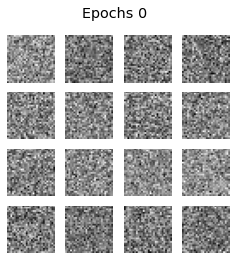

In [ ]:
# let's see a sample output of an untrained generator. As we expect, this will be just random points. After training, these will resemble digits from the MNIST dataset

# generate a batch of noise input (batch size = 16)
test_noise = tf.random.normal([16, random_normal_dimensions])

# feed the batch to the untrained generator
test_image = generator(test_noise)

# visualize sample output
plot_multiple_images(test_image, n_cols=4)

Discriminator: takes in the input (fake or real) images and determines if it is fake or not. Thus, the input shape will be that of the training images. This will be flattened so it can be fed to the dense networks and the final output is a value between 0 (fake) and 1 (real).

In [ ]:
# build the discriminator model
discriminator = keras.models.Sequential([
 keras.layers.Flatten(input_shape=[28, 28]),
 keras.layers.Dense(128, activation="selu"),
 keras.layers.Dense(64, activation="selu"),
 keras.layers.Dense(1, activation="sigmoid")
])

GAN.

In [ ]:
# append these two models to build the GAN.
gan = keras.models.Sequential([generator, discriminator])

In [ ]:
# configure training parameters
discriminator.compile(loss="binary_crossentropy", optimizer="rmsprop")
discriminator.trainable = False
gan.compile(loss="binary_crossentropy", optimizer="rmsprop")

Training loop consists of 2 phases: 1) trains the discriminator to distinguish between fake or real data and 2) trains the generator to generate images that will trick the discriminator.

In [ ]:
# at each epoch, we display a sample gallery of images to see the fake images being created by the generator 

def train_gan(gan, dataset, random_normal_dimensions, n_epochs=50):
  """Defines the two-phase training loop of the GAN
  Args:
    gan -- the GAN model which has the generator and discriminator
    dataset -- the training set of real image
    random_normal_dimensions -- dimensionality of the input to the generator
    n_epochs -- number of epochs
  """
  # get the two sub networks from the GAN model
  generator, discriminator = gan.layers

  # start loop
  for epoch in range(n_epochs):
    print("Epoch {}/{}".format(epoch + 1, n_epochs))       
    for real_images in dataset:
        # infer batch size from the training batch
        batch_size = real_images.shape[0]

        # Train the discriminator - PHASE 1
        # Create the noise
        noise = tf.random.normal(shape=[batch_size, random_normal_dimensions])
        
        # Use the noise to generate fake images
        fake_images = generator(noise)
        
        # Create a list by concatenating the fake images with the real ones
        mixed_images = tf.concat([fake_images, real_images], axis=0)
        
        # Create the labels for the discriminator
        # 0 for the fake images
        # 1 for the real images
        discriminator_labels = tf.constant([[0.]] * batch_size + [[1.]] * batch_size)
        
        # Ensure that the discriminator is trainable
        discriminator.trainable = True
        
        # Use train_on_batch to train the discriminator with the mixed images and the discriminator labels
        discriminator.train_on_batch(mixed_images, discriminator_labels)
        
        # Train the generator - PHASE 2
        # create a batch of noise input to feed to the GAN
        noise = tf.random.normal(shape=[batch_size, random_normal_dimensions])

        # label all generated images to be "real"
        generator_labels = tf.constant([[1.]] * batch_size)

        # Freeze the discriminator
        discriminator.trainable = False

        # Train the GAN on the noise with the labels all set to be true
        gan.train_on_batch(noise, generator_labels)

    # plot the fake images used to train the discriminator
    plot_multiple_images(fake_images, 8, epoch)

    plt.show() 

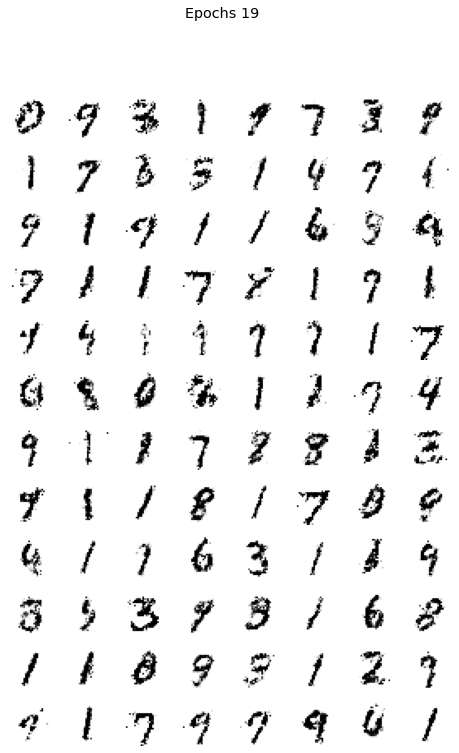

In [ ]:
# see how the fake images improve per epoch.
train_gan(gan, dataset, random_normal_dimensions, n_epochs=20)

Notice that as the training progresses, the model tends to be biased towards a subset of the numbers such as 1, 7, and 9 and this is called mode collapse.

In [ ]:
# create gif
import imageio
import glob

imageio.plugins.freeimage.download()

!rm -rf ./results/gane-mnist-anim.gif

anim_file = './gane-mnist-anim.gif'

filenames = glob.glob('/content/image_at_epoch_*.png')
filenames = sorted(filenames)
last = -1
images = []

for filename in filenames:
    image = imageio.imread(filename)
    images.append(image)

imageio.mimsave(anim_file, images, 'GIF-FI', fps=1)

## Example 4. A demo of Deep Convolutional GAN (DCGAN) trained on fashion MNIST Dataset.

In [ ]:
import tensorflow as tf
import tensorflow.keras as keras

import numpy as np
import matplotlib.pyplot as plt
from IPython import display

In [ ]:
# utiities
def plot_results(images, n_cols=None, epoch=0):
  """Visualize fake images"""
  display.clear_output(wait=False)

  n_cols = n_cols or len(images)
  n_rows = (len(images) - 1) // n_cols + 1

  if images.shape[-1] == 1:
    images = np.squeeze(images, axis=-1)
  
  fig = plt.figure(figsize=(n_cols, n_rows))
  fig.suptitle(f"Epochs {epoch}", fontsize="x-large")

  for index, image in enumerate(images):
    plt.subplot(n_rows, n_cols, index+1)
    plt.imshow(image, cmap="binary")
    plt.axis("off")
  
  plt.savefig('image_at_epoch_{:04d}.png'.format(epoch))

Download and prepare the dataset.

In [ ]:
# download the training images
(X_train, _), _  = keras.datasets.fashion_mnist.load_data()

# normalize pixel values
X_train = X_train.astype(np.float32) / 255

# reshape and rescale
X_train = X_train.reshape(-1, 28, 28, 1) * 2 - 1.

BATCH_SIZE = 128

# create batches of tensors to be fed into the model
dataset = tf.data.Dataset.from_tensor_slices(X_train)
dataset = dataset.shuffle(1000)
dataset = dataset.batch(BATCH_SIZE, drop_remainder=False).prefetch(1)

4422102/4422102 [==============================] - 0s 0us/step


Build the model.

Generator: 

In [ ]:
codings_size = 32

generator = keras.models.Sequential([
  keras.layers.Dense(7 * 7 * 128, input_shape=[codings_size]),
  keras.layers.Reshape([7, 7, 128]),
  keras.layers.BatchNormalization(),
  keras.layers.Conv2DTranspose(64, kernel_size=5, strides=2, padding="SAME", activation="selu"),  # reducing the number of filters by half and using a stride of 2
  keras.layers.BatchNormalization(),
  keras.layers.Conv2DTranspose(1, kernel_size=5, strides=2, padding="SAME", activation="tanh")                               
])

generator.summary()

Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_6 (Dense)             (None, 6272)              206976    
                                                                 
 reshape_1 (Reshape)         (None, 7, 7, 128)         0         
                                                                 
 batch_normalization_15 (Bat  (None, 7, 7, 128)        512       
 chNormalization)                                                
                                                                 
 conv2d_transpose (Conv2DTra  (None, 14, 14, 64)       204864    
 nspose)                                                         
                                                                 
 batch_normalization_16 (Bat  (None, 14, 14, 64)       256       
 chNormalization)                                                
                                                      

Shape of the generated batch: (16, 28, 28, 1)


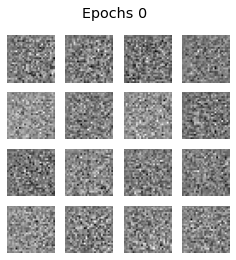

In [ ]:
# generate a batch of noise input (batch size = 16)
test_noise = tf.random.normal([16, codings_size])

# feed the batch to the untrained generator
test_image = generator(test_noise)

# visualize sample output
plot_results(test_image, n_cols=4, epoch=0)

print(f"Shape of the generated batch: {test_image.shape}")

Discriminator.

In [ ]:
discriminator = keras.models.Sequential([
  keras.layers.Conv2D(64, kernel_size=5, strides=2, padding="SAME", activation=keras.layers.LeakyReLU(0.2), input_shape=[28, 28, 1]),
  keras.layers.Dropout(0.4),
  keras.layers.Conv2D(128, kernel_size=5, strides=2, padding="SAME", activation=keras.layers.LeakyReLU(0.2)),
  keras.layers.Dropout(0.4),
  keras.layers.Flatten(),
  keras.layers.Dense(1, activation="sigmoid")
])

discriminator.summary()

Model: "sequential_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 14, 14, 64)        1664      
                                                                 
 dropout (Dropout)           (None, 14, 14, 64)        0         
                                                                 
 conv2d_1 (Conv2D)           (None, 7, 7, 128)         204928    
                                                                 
 dropout_1 (Dropout)         (None, 7, 7, 128)         0         
                                                                 
 flatten_2 (Flatten)         (None, 6272)              0         
                                                                 
 dense_7 (Dense)             (None, 1)                 6273      
                                                                 
Total params: 212,865
Trainable params: 212,865
Non-tr

The complete GAN.

In [ ]:
gan = keras.models.Sequential([generator, discriminator])

In [ ]:
# configure the model for training
discriminator.compile(loss="binary_crossentropy", optimizer="rmsprop")
discriminator.trainable = False
gan.compile(loss="binary_crossentropy", optimizer="rmsprop")

Train the model.

In [ ]:
def train_gan(gan, dataset, random_normal_dimensions, n_epochs=50):
    """ Defines the two-phase training loop of the GAN
    Args:
      gan -- the GAN model which has the generator and discriminator
      dataset -- the training set of real images
      random_normal_dimensions -- dimensionality of the input to the generator
      n_epochs -- number of epochs
    """
    generator, discriminator = gan.layers
    for epoch in range(n_epochs):
        print("Epoch {}/{}".format(epoch + 1, n_epochs))       
        for real_images in dataset:
            # infer batch size from the training batch
            batch_size = real_images.shape[0]

            # Train the discriminator - PHASE 1
            # create the noise
            noise = tf.random.normal(shape=[batch_size, random_normal_dimensions])

            # use the noise to generate fake images
            fake_images = generator(noise)

            # create a list by concatenating the fake images with the real ones
            mixed_images = tf.concat([fake_images, real_images], axis=0)

            # Create the labels for the discriminator
            # 0 for the fake images
            # 1 for the real images
            discriminator_labels = tf.constant([[0.]] * batch_size + [[1.]] * batch_size)

            # ensure that the discriminator is trainable
            discriminator.trainable = True

            # use train_on_batch to train the discriminator with the mixed images and the discriminator labels
            discriminator.train_on_batch(mixed_images, discriminator_labels)

            # Train the generator - PHASE 2
            # create a batch of noise input to feed to the GAN
            noise = tf.random.normal(shape=[batch_size, random_normal_dimensions])
            
            # label all generated images to be "real"
            generator_labels = tf.constant([[1.]] * batch_size)

            # freeze the discriminator
            discriminator.trainable = False

            # train the GAN on the noise with the labels all set to be true
            gan.train_on_batch(noise, generator_labels)
        
        # plot the fake images used to train the discriminator
        plot_results(fake_images, 16, epoch)                     
        plt.show()

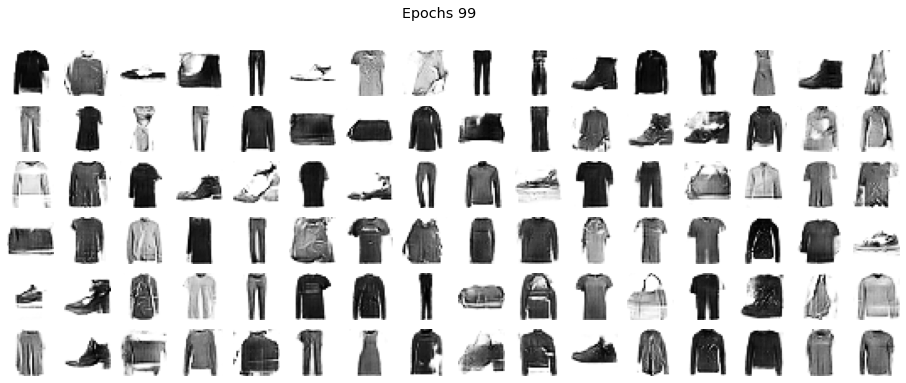

In [ ]:
train_gan(gan, dataset, codings_size, 100)

In [ ]:
# create gif
import imageio
import glob

imageio.plugins.freeimage.download()

!rm -rf ./results/gane-fashion-mnist-anim.gif

anim_file = './gane-fashion-mnist-anim.gif'

filenames = glob.glob('/content/image_at_epoch_*.png')
filenames = sorted(filenames)
last = -1
images = []

for filename in filenames:
    image = imageio.imread(filename)
    images.append(image)

imageio.mimsave(anim_file, images, 'GIF-FI', fps=3)

## Example 5. A GAN trained on the CelebA Dataset.

In [ ]:
# imports 

# install tensorflow_addons
!pip install -U tensorflow-addons

import tensorflow as tf
import tensorflow_datasets as tfds
from tensorflow.keras.utils import plot_model
from tensorflow.keras import layers
import tensorflow_addons as tfa

import os
import zipfile
import glob
import urllib.request
from enum import Enum
from tqdm import tqdm
from functools import partial

import matplotlib.pyplot as plt
import numpy as np

from PIL import Image
from IPython.display import display
from IPython.display import Image as IpyImage
import imageio
import cv2

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 1.1 MB 5.3 MB/s 


Setup TPU: we will use a TPU and its corresponding distribution strategy to speed up the training.

In [ ]:
tpu_grpc_url = "grpc://" + os.environ["COLAB_TPU_ADDR"]
tpu_cluster_resolver = tf.distribute.cluster_resolver.TPUClusterResolver(tpu_grpc_url)
tf.config.experimental_connect_to_cluster(tpu_cluster_resolver) 
tf.tpu.experimental.initialize_tpu_system(tpu_cluster_resolver)   
strategy = tf.distribute.experimental.TPUStrategy(tpu_cluster_resolver) 

In [ ]:
class Reduction(Enum):
    NONE = 0
    SUM = 1
    MEAN = 2
    CONCAT = 3

def distributed(*reduction_flags):
    def _decorator(fun):
        def per_replica_reduction(z, flag):
            if flag == Reduction.NONE:
                return z
            elif flag == Reduction.SUM:
                return strategy.reduce(tf.distribute.ReduceOp.SUM, z, axis=None)
            elif flag == Reduction.MEAN:
                return strategy.reduce(tf.distribute.ReduceOp.MEAN, z, axis=None)
            elif flag == Reduction.CONCAT:
                z_list = strategy.experimental_local_results(z)
                return tf.concat(z_list, axis=0)
            else:
                raise NotImplementedError()

        @tf.function
        def _decorated_fun(*args, **kwargs):
            fun_result = strategy.run(fun, args=args, kwargs=kwargs)
            if len(reduction_flags) == 0:
                assert fun_result is None
                return
            elif len(reduction_flags) == 1:
                assert type(fun_result) is not tuple and fun_redult is not None
                return per_replica_reduction(fun_result, *reduction_flags)
            else:
                assert type(fun_result) is tuple
                return tuple((per_replica_reduction(fr, rf) for fr, rf in zip(fun_result, reduction_flags)))
        return _decorated_fun
    return _decorator

Download and prepare the dataset.

In [ ]:
# make a data directory
try:
  os.mkdir('/tmp/celeb')
except OSError:
  pass

# download the dataset archive
data_url = "https://storage.googleapis.com/laurencemoroney-blog.appspot.com/Resources/archive.zip"
data_file_name = "archive.zip"
download_dir = '/tmp/celeb/'
urllib.request.urlretrieve(data_url, data_file_name)

# extract the zipped file
zip_ref = zipfile.ZipFile(data_file_name, 'r')
zip_ref.extractall(download_dir)
zip_ref.close()

Preprocessing steps include cropping and transforming the pixel values to the range [-1, 1]. Training batches are then prepared so it can be fed into the model later.

In [ ]:
def load_celeba(batch_size, resize=64, crop_size=128):
  """Creates batches of preprocessed images from the JPG files
  Args:
    batch_size - batch size
    resize - size in pixels to resize the images
    crop_size - size to crop from the image
  
  Returns:
    prepared dataset
  """
  # initialize zero-filled array equal to the size of the dataset
  image_paths = sorted(glob.glob("/tmp/celeb/img_align_celeba/img_align_celeba/*.jpg"))
  images = np.zeros((len(image_paths), resize, resize, 3), np.uint8)
  print("Creating Images")

  # crop and resize the raw images then put into the array
  for i, path in tqdm(enumerate(image_paths)):
    with Image.open(path) as img:
      left = (img.size[0] - crop_size) // 2
      top = (img.size[1] - crop_size) // 2
      right = left + crop_size
      bottom = top + crop_size
      img = img.crop((left, top, right, bottom))
      img = img.resize((resize, resize), Image.LANCZOS)
      images[i] = np.asarray(img, np.uint8)
  
  # split the images array into two
  split_n = images.shape[0] // 2
  images1, images2 = images[:split_n], images[split_n:2 * split_n]
  del images

  # preprocessing function to convert the pixel values into the range [-1,1]
  def preprocess(img):
      x = tf.cast(img, tf.float32) / 127.5 - 1.0
      return x
  
  # use the preprocessing function on the arrays and create batches
  dataset = tf.data.Dataset.from_tensor_slices((images1, images2))
  dataset = dataset.map(
      lambda x1, x2: (preprocess(x1), preprocess(x2))
  ).shuffle(4096).batch(batch_size, drop_remainder=True).prefetch(tf.data.experimental.AUTOTUNE)
  
  return dataset

# use the function above to load and prepare the dataset
batch_size = 8
batch_size = batch_size * strategy.num_replicas_in_sync
dataset = load_celeba(batch_size)
out_dir = "celeba_out"

Creating Images


202599it [06:15, 539.69it/s]


Build the model.

In [ ]:
# Utilities

def _get_norm_layer(norm):
    if norm == 'NA':
        return lambda: lambda x: x
    elif norm == 'batch_normalization':
        return layers.BatchNormalization
    elif norm == 'instance_normalization':
        return tfa.layers.InstanceNormalization
    elif norm == 'layer_normalization':
        return layers.LayerNormalization


def get_initializers():
    return (tf.keras.initializers.RandomNormal(mean=0.0, stddev=0.02), # conv initializer
            tf.keras.initializers.RandomNormal(mean=1.0, stddev=0.02)) # bn gamma initializer

# try other settings: additional modes made available are based on DRAGAN and WGAN-GP !!
def gradient_penalty(f, real, fake, mode):
    def _gradient_penalty(f, real, fake=None):
        def _interpolate(a, b=None):
            if b is None:   # interpolation in DRAGAN
                beta = tf.random.uniform(shape=tf.shape(a), minval=0., maxval=1.)
                b = a + 0.5 * tf.math.reduce_std(a) * beta
            shape = [tf.shape(a)[0]] + [1] * (a.shape.ndims - 1)
            alpha = tf.random.uniform(shape=shape, minval=0., maxval=1.)
            inter = a + alpha * (b - a)
            inter.set_shape(a.shape)
            return inter

        x = _interpolate(real, fake)
        with tf.GradientTape() as t:
            t.watch(x)
            pred = f(x)
        grad = t.gradient(pred, x)
        norm = tf.norm(tf.reshape(grad, [tf.shape(grad)[0], -1]), axis=1)
        gp = tf.reduce_mean((norm - 1.)**2)

        return gp

    if mode == 'none':
        gp = tf.constant(0, dtype=real.dtype)
    elif mode == 'dragan':
        gp = _gradient_penalty(f, real)
    elif mode == 'wgan-gp':
        gp = _gradient_penalty(f, real, fake)

    return gp

Generator.

In [ ]:
def create_generator(input_shape=(1, 1, 128),
                    output_channels=3,
                    dim=64,
                    n_upsamplings=4,
                    norm='batch_normalization',
                    name='generator'):
  
    Normalization = _get_norm_layer(norm)
    conv_initializer, bn_gamma_initializer = get_initializers()

    # 0
    x = inputs = tf.keras.Input(shape=input_shape)

    # 1: 1x1 -> 4x4
    dimensions = min(dim * 2 ** (n_upsamplings - 1), dim * 8)
    x = layers.Conv2DTranspose(
        dimensions, 4, strides=1, padding='valid', use_bias=False,         
        # kernel_initializer=conv_initializer
    )(x)
    x = Normalization(
        # gamma_initializer=bn_gamma_initializer
        )(x)
    x = layers.ReLU()(x)

    # 2: upsamplings, 4x4 -> 8x8 -> 16x16 -> ...
    for i in range(n_upsamplings - 1):
        dimensions = min(dim * 2 ** (n_upsamplings - 2 - i), dim * 8)
        x = layers.Conv2DTranspose(
            dimensions, 4, strides=2, padding='same', use_bias=False,
            # kernel_initializer=conv_initializer
            )(x)
        x = Normalization(
            # gamma_initializer=bn_gamma_initializer
            )(x)
        x = layers.ReLU()(x)

    x = layers.Conv2DTranspose(
        output_channels, 4, strides=2, padding='same',
        # kernel_initializer=conv_initializer
    )(x)

    outputs = layers.Activation('tanh')(x)

    return tf.keras.Model(inputs=inputs, outputs=outputs, name=name)

Discriminator.

In [ ]:
def create_discriminator(input_shape=(64, 64, 3),
                        dim=64,
                        n_downsamplings=4,
                        norm='batch_normalization',
                        name='discriminator'):
    Normalization = _get_norm_layer(norm)
    conv_initializer, bn_gamma_initializer = get_initializers()

    # 0
    x = inputs = tf.keras.Input(shape=input_shape)

    # 1: downsamplings, ... -> 16x16 -> 8x8 -> 4x4
    x = layers.Conv2D(dim, 4, strides=2, padding='same',
                      # kernel_initializer=conv_initializer
                      )(x)
    x = layers.LeakyReLU(alpha=0.2)(x)

    for i in range(n_downsamplings - 1):
        dimensions = min(dim * 2 ** (i + 1), dim * 8)
        x = layers.Conv2D(dimensions, 4, strides=2, padding='same', use_bias=False,
                          # kernel_initializer=conv_initializer
                          )(x)
        x = Normalization(
            # gamma_initializer=bn_gamma_initializer
            )(x)
        x = layers.LeakyReLU(alpha=0.2)(x)

    # 2: logit
    outputs = layers.Conv2D(1, 4, strides=1, padding='valid',
                            # kernel_initializer=conv_initializer
                            )(x)

    return tf.keras.Model(inputs=inputs, outputs=outputs, name=name)

Putting all generator and discriminator together.

In [ ]:
# Settings
resize = 64
shape = (resize, resize, 3)
z_dim = 128
n_G_upsamplings = n_D_downsamplings = 4
gradient_penalty_mode = 'none'

if gradient_penalty_mode == 'none':
  d_norm = 'batch_normalization'
elif gradient_penalty_mode in ['dragan', 'wgan-gp']:  
  # Avoid using BN with GP
  d_norm = 'layer_normalization'
gradient_penalty_weight = 10.0


# Build the GAN
with strategy.scope():
    # create the generator model
    model_G = create_generator(input_shape=(1, 1, z_dim), output_channels=shape[-1], n_upsamplings=n_G_upsamplings)
    
    # create the discriminator model
    model_D = create_discriminator(input_shape=shape, n_downsamplings=n_D_downsamplings, norm=d_norm)
    
    # print summaries
    model_G.summary()
    model_D.summary()

    # set optimizers
    param_G = tf.keras.optimizers.Adam(lr=0.0002, beta_1=0.5)
    param_D = tf.keras.optimizers.Adam(lr=0.0002, beta_1=0.5)

    # create distributed dataset
    dataset = strategy.experimental_distribute_dataset(dataset)
    
    # set the loss function
    loss_func = tf.keras.losses.BinaryCrossentropy(
        from_logits=True, 
        reduction=tf.keras.losses.Reduction.NONE
    )

Model: "generator"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 1, 1, 128)]       0         
                                                                 
 conv2d_transpose (Conv2DTra  (None, 4, 4, 512)        1048576   
 nspose)                                                         
                                                                 
 batch_normalization (BatchN  (None, 4, 4, 512)        2048      
 ormalization)                                                   
                                                                 
 re_lu (ReLU)                (None, 4, 4, 512)         0         
                                                                 
 conv2d_transpose_1 (Conv2DT  (None, 8, 8, 256)        2097152   
 ranspose)                                                       
                                                         

/usr/local/lib/python3.8/dist-packages/keras/optimizers/optimizer_v2/adam.py:110: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


Training.

In [ ]:
# Utilities: helper functions for visualizing and saving the images per epoch

def make_grid(imgs, nrow, padding=0):
    assert imgs.ndim == 4 and nrow > 0

    batch, height, width, ch = imgs.shape
    n = nrow * (batch // nrow + np.sign(batch % nrow))
    ncol = n // nrow
    pad = np.zeros((n - batch, height, width, ch), imgs.dtype)
    x = np.concatenate([imgs, pad], axis=0)

    # border padding if required
    if padding > 0:
        x = np.pad(x, ((0, 0), (0, padding), (0, padding), (0, 0)),
                   "constant", constant_values=(0, 0))
        height += padding
        width += padding

    x = x.reshape(ncol, nrow, height, width, ch)
    x = x.transpose([0, 2, 1, 3, 4])  # (ncol, height, nrow, width, ch)
    x = x.reshape(height * ncol, width * nrow, ch)
    
    if padding > 0:
        x = x[:(height * ncol - padding),:(width * nrow - padding),:]
    return x

def save_img(imgs, filepath, nrow, padding=0):
    grid_img = make_grid(imgs, nrow, padding=padding)
    grid_img = ((grid_img + 1.0) * 127.5).astype(np.uint8)
    with Image.fromarray(grid_img) as img:
        img.save(filepath)

In [ ]:
# this function defines the training on a given batch, which is done in the two-phases:
# first, we train the discriminator to distinguish between fake and real images
# next, we train the generator to create fake images that will fool the discriminator
@distributed(Reduction.SUM, Reduction.SUM, Reduction.CONCAT)
def train_on_batch(real_img1, real_img2):
    '''trains the GAN on a given batch'''
    # concatenate the real image inputs
    real_img = tf.concat([real_img1, real_img2], axis=0)

    # PHASE ONE - train the discriminator
    with tf.GradientTape() as d_tape:

        # create noise input
        z = tf.random.normal(shape=(real_img.shape[0], 1, 1, z_dim))

        # generate fake images
        fake_img = model_G(z)

        # feed the fake images to the discriminator
        fake_out = model_D(fake_img)

        # feed the real images to the discriminator
        real_out = model_D(real_img)

        # use the loss function to measure how well the discriminator
        # labels fake or real images
        d_fake_loss = loss_func(tf.zeros_like(fake_out), fake_out)
        d_real_loss = loss_func(tf.ones_like(real_out), real_out)

        # get the total loss
        d_loss = (d_fake_loss + d_real_loss) 
        d_loss = tf.reduce_sum(d_loss) / (batch_size * 2)

        # Gradient Penalty (ignore if you set mode to `none`)
        gp = gradient_penalty(partial(model_D, training=True), real_img, fake_img, mode=gradient_penalty_mode)
        gp = gp  / (batch_size * 2)
        d_loss = d_loss + gp * gradient_penalty_weight

    # get the gradients
    gradients = d_tape.gradient(d_loss, model_D.trainable_variables)
    
    # update the weights of the discriminator
    param_D.apply_gradients(zip(gradients, model_D.trainable_variables))
    

    # PHASE TWO - train the generator
    with tf.GradientTape() as g_tape:
        # create noise input
        z = tf.random.normal(shape=(real_img.shape[0], 1, 1, z_dim))
        
        # generate fake images
        fake_img = model_G(z)

        # feed fake images to the discriminator
        fake_out = model_D(fake_img)
        
        # use loss function to measure how well the generator
        # is able to trick the discriminator (i.e. model_D should output 1's)
        g_loss = loss_func(tf.ones_like(fake_out), fake_out)
        g_loss = tf.reduce_sum(g_loss) / (batch_size * 2)
    
    # get the gradients
    gradients = g_tape.gradient(g_loss, model_G.trainable_variables)

    # update the weights of the generator
    param_G.apply_gradients(zip(gradients, model_G.trainable_variables))
    
    # return the losses and fake images for monitoring
    return d_loss, g_loss, fake_img 

[Epoch 0]: : 1580it [02:57,  9.02it/s, g_loss=0.492, d_loss=0.181]Exception ignored in: <function Executor.__del__ at 0x7f6fd2d32ca0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.8/dist-packages/tensorflow/python/eager/executor.py", line 46, in __del__
    self.wait()
  File "/usr/local/lib/python3.8/dist-packages/tensorflow/python/eager/executor.py", line 65, in wait
    pywrap_tfe.TFE_ExecutorWaitForAllPendingNodes(self._handle)
tensorflow.python.framework.errors_impl.OutOfRangeError: End of sequence
[Epoch 0]: : 1582it [02:57,  8.91it/s, g_loss=0.492, d_loss=0.181]


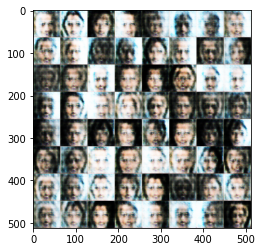

[Epoch 1]: : 1581it [03:11,  8.07it/s, g_loss=0.0833, d_loss=0.0529]Exception ignored in: <function Executor.__del__ at 0x7f6fd2d32ca0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.8/dist-packages/tensorflow/python/eager/executor.py", line 46, in __del__
    self.wait()
  File "/usr/local/lib/python3.8/dist-packages/tensorflow/python/eager/executor.py", line 65, in wait
    pywrap_tfe.TFE_ExecutorWaitForAllPendingNodes(self._handle)
tensorflow.python.framework.errors_impl.OutOfRangeError: End of sequence
[Epoch 1]: : 1582it [03:11,  8.26it/s, g_loss=0.0833, d_loss=0.0529]


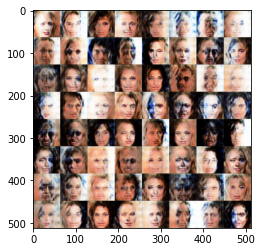

[Epoch 2]: : 1580it [03:52, 10.39it/s, g_loss=0.0411, d_loss=0.0546]Exception ignored in: <function Executor.__del__ at 0x7f6fd2d32ca0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.8/dist-packages/tensorflow/python/eager/executor.py", line 46, in __del__
    self.wait()
  File "/usr/local/lib/python3.8/dist-packages/tensorflow/python/eager/executor.py", line 65, in wait
    pywrap_tfe.TFE_ExecutorWaitForAllPendingNodes(self._handle)
tensorflow.python.framework.errors_impl.OutOfRangeError: End of sequence
[Epoch 2]: : 1582it [03:52,  6.79it/s, g_loss=0.0411, d_loss=0.0546]


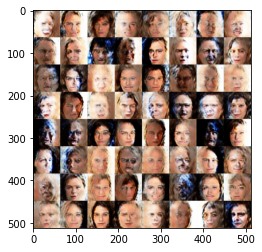

[Epoch 3]: : 1581it [03:30, 12.21it/s, g_loss=0.171, d_loss=0.0576]Exception ignored in: <function Executor.__del__ at 0x7f6fd2d32ca0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.8/dist-packages/tensorflow/python/eager/executor.py", line 46, in __del__
    self.wait()
  File "/usr/local/lib/python3.8/dist-packages/tensorflow/python/eager/executor.py", line 65, in wait
    pywrap_tfe.TFE_ExecutorWaitForAllPendingNodes(self._handle)
tensorflow.python.framework.errors_impl.OutOfRangeError: End of sequence
[Epoch 3]: : 1582it [03:30,  7.50it/s, g_loss=0.171, d_loss=0.0576]


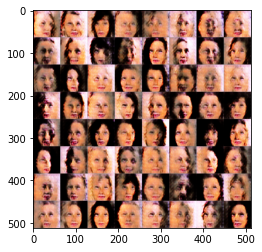

[Epoch 4]: : 1580it [05:35,  7.13it/s, g_loss=0.0144, d_loss=0.0651]Exception ignored in: <function Executor.__del__ at 0x7f6fd2d32ca0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.8/dist-packages/tensorflow/python/eager/executor.py", line 46, in __del__
    self.wait()
  File "/usr/local/lib/python3.8/dist-packages/tensorflow/python/eager/executor.py", line 65, in wait
    pywrap_tfe.TFE_ExecutorWaitForAllPendingNodes(self._handle)
tensorflow.python.framework.errors_impl.OutOfRangeError: End of sequence
[Epoch 4]: : 1582it [05:35,  4.72it/s, g_loss=0.0144, d_loss=0.0651]


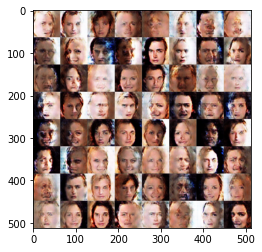

[Epoch 5]: : 1582it [07:35, 16.98it/s, g_loss=1.1, d_loss=1.63]Exception ignored in: <function Executor.__del__ at 0x7f6fd2d32ca0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.8/dist-packages/tensorflow/python/eager/executor.py", line 46, in __del__
    self.wait()
  File "/usr/local/lib/python3.8/dist-packages/tensorflow/python/eager/executor.py", line 65, in wait
    pywrap_tfe.TFE_ExecutorWaitForAllPendingNodes(self._handle)
tensorflow.python.framework.errors_impl.OutOfRangeError: End of sequence
[Epoch 5]: : 1582it [07:35,  3.48it/s, g_loss=1.1, d_loss=1.63]


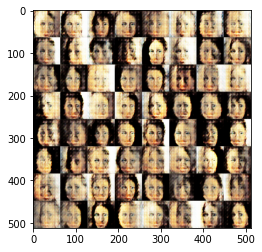

[Epoch 6]: : 1581it [08:34,  1.22it/s, g_loss=0.00255, d_loss=0.0198]Exception ignored in: <function Executor.__del__ at 0x7f6fd2d32ca0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.8/dist-packages/tensorflow/python/eager/executor.py", line 46, in __del__
    self.wait()
  File "/usr/local/lib/python3.8/dist-packages/tensorflow/python/eager/executor.py", line 65, in wait
    pywrap_tfe.TFE_ExecutorWaitForAllPendingNodes(self._handle)
tensorflow.python.framework.errors_impl.OutOfRangeError: End of sequence
[Epoch 6]: : 1582it [08:34,  3.07it/s, g_loss=0.00255, d_loss=0.0198]


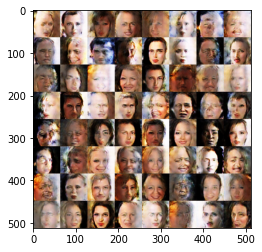

[Epoch 7]: : 1582it [06:26, 11.78it/s, g_loss=0.0035, d_loss=0.0176]Exception ignored in: <function Executor.__del__ at 0x7f6fd2d32ca0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.8/dist-packages/tensorflow/python/eager/executor.py", line 46, in __del__
    self.wait()
  File "/usr/local/lib/python3.8/dist-packages/tensorflow/python/eager/executor.py", line 65, in wait
    pywrap_tfe.TFE_ExecutorWaitForAllPendingNodes(self._handle)
tensorflow.python.framework.errors_impl.OutOfRangeError: End of sequence
[Epoch 7]: : 1582it [06:26,  4.09it/s, g_loss=0.0035, d_loss=0.0176]


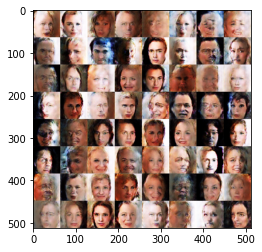

[Epoch 8]: : 1580it [07:05,  3.53it/s, g_loss=0.0413, d_loss=0.0876]Exception ignored in: <function Executor.__del__ at 0x7f6fd2d32ca0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.8/dist-packages/tensorflow/python/eager/executor.py", line 46, in __del__
    self.wait()
  File "/usr/local/lib/python3.8/dist-packages/tensorflow/python/eager/executor.py", line 65, in wait
    pywrap_tfe.TFE_ExecutorWaitForAllPendingNodes(self._handle)
tensorflow.python.framework.errors_impl.OutOfRangeError: End of sequence
[Epoch 8]: : 1582it [07:05,  3.72it/s, g_loss=0.0413, d_loss=0.0876]


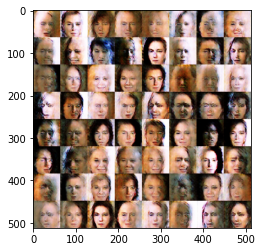

[Epoch 9]: : 1582it [05:47, 19.76it/s, g_loss=0.005, d_loss=0.0255]Exception ignored in: <function Executor.__del__ at 0x7f6fd2d32ca0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.8/dist-packages/tensorflow/python/eager/executor.py", line 46, in __del__
    self.wait()
  File "/usr/local/lib/python3.8/dist-packages/tensorflow/python/eager/executor.py", line 65, in wait
    pywrap_tfe.TFE_ExecutorWaitForAllPendingNodes(self._handle)
tensorflow.python.framework.errors_impl.OutOfRangeError: End of sequence
[Epoch 9]: : 1582it [05:47,  4.55it/s, g_loss=0.005, d_loss=0.0255]


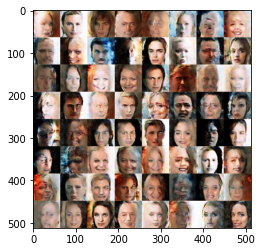

[Epoch 10]: : 1580it [05:59, 13.39it/s, g_loss=0.0027, d_loss=0.00779]Exception ignored in: <function Executor.__del__ at 0x7f6fd2d32ca0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.8/dist-packages/tensorflow/python/eager/executor.py", line 46, in __del__
    self.wait()
  File "/usr/local/lib/python3.8/dist-packages/tensorflow/python/eager/executor.py", line 65, in wait
    pywrap_tfe.TFE_ExecutorWaitForAllPendingNodes(self._handle)
tensorflow.python.framework.errors_impl.OutOfRangeError: End of sequence
[Epoch 10]: : 1582it [06:00,  4.39it/s, g_loss=0.0027, d_loss=0.00779]


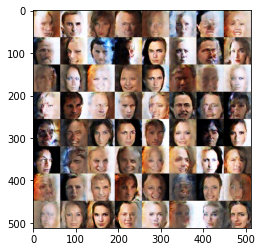

[Epoch 11]: : 1581it [06:15, 20.29it/s, g_loss=0.0055, d_loss=0.0115] Exception ignored in: <function Executor.__del__ at 0x7f6fd2d32ca0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.8/dist-packages/tensorflow/python/eager/executor.py", line 46, in __del__
    self.wait()
  File "/usr/local/lib/python3.8/dist-packages/tensorflow/python/eager/executor.py", line 65, in wait
    pywrap_tfe.TFE_ExecutorWaitForAllPendingNodes(self._handle)
tensorflow.python.framework.errors_impl.OutOfRangeError: End of sequence
[Epoch 11]: : 1582it [06:15,  4.21it/s, g_loss=0.0055, d_loss=0.0115]


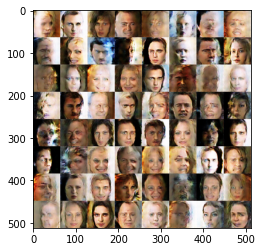

[Epoch 12]: : 1581it [06:52, 15.37it/s, g_loss=0.00497, d_loss=0.0372]Exception ignored in: <function Executor.__del__ at 0x7f6fd2d32ca0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.8/dist-packages/tensorflow/python/eager/executor.py", line 46, in __del__
    self.wait()
  File "/usr/local/lib/python3.8/dist-packages/tensorflow/python/eager/executor.py", line 65, in wait
    pywrap_tfe.TFE_ExecutorWaitForAllPendingNodes(self._handle)
tensorflow.python.framework.errors_impl.OutOfRangeError: End of sequence
[Epoch 12]: : 1582it [06:52,  3.83it/s, g_loss=0.00497, d_loss=0.0372]


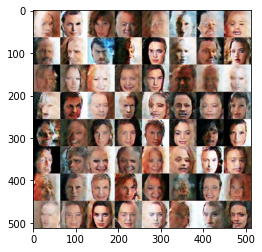

[Epoch 13]: : 1580it [05:45,  5.55it/s, g_loss=0.003, d_loss=0.0109]  Exception ignored in: <function Executor.__del__ at 0x7f6fd2d32ca0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.8/dist-packages/tensorflow/python/eager/executor.py", line 46, in __del__
    self.wait()
  File "/usr/local/lib/python3.8/dist-packages/tensorflow/python/eager/executor.py", line 65, in wait
    pywrap_tfe.TFE_ExecutorWaitForAllPendingNodes(self._handle)
tensorflow.python.framework.errors_impl.OutOfRangeError: End of sequence
[Epoch 13]: : 1582it [05:45,  4.58it/s, g_loss=0.003, d_loss=0.0109]


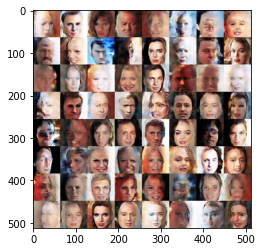

[Epoch 14]: : 1580it [08:18,  5.27it/s, g_loss=0.00394, d_loss=0.011] Exception ignored in: <function Executor.__del__ at 0x7f6fd2d32ca0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.8/dist-packages/tensorflow/python/eager/executor.py", line 46, in __del__
    self.wait()
  File "/usr/local/lib/python3.8/dist-packages/tensorflow/python/eager/executor.py", line 65, in wait
    pywrap_tfe.TFE_ExecutorWaitForAllPendingNodes(self._handle)
tensorflow.python.framework.errors_impl.OutOfRangeError: End of sequence
[Epoch 14]: : 1582it [08:18,  3.17it/s, g_loss=0.00394, d_loss=0.011]


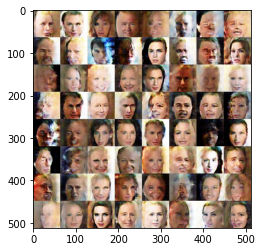

[Epoch 15]: : 1581it [07:47,  2.49it/s, g_loss=0.000876, d_loss=0.0228]Exception ignored in: <function Executor.__del__ at 0x7f6fd2d32ca0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.8/dist-packages/tensorflow/python/eager/executor.py", line 46, in __del__
    self.wait()
  File "/usr/local/lib/python3.8/dist-packages/tensorflow/python/eager/executor.py", line 65, in wait
    pywrap_tfe.TFE_ExecutorWaitForAllPendingNodes(self._handle)
tensorflow.python.framework.errors_impl.OutOfRangeError: End of sequence
[Epoch 15]: : 1582it [07:47,  3.39it/s, g_loss=0.000876, d_loss=0.0228]


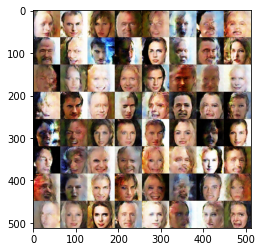

[Epoch 16]: : 1581it [07:26, 18.54it/s, g_loss=0.00358, d_loss=0.0133]Exception ignored in: <function Executor.__del__ at 0x7f6fd2d32ca0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.8/dist-packages/tensorflow/python/eager/executor.py", line 46, in __del__
    self.wait()
  File "/usr/local/lib/python3.8/dist-packages/tensorflow/python/eager/executor.py", line 65, in wait
    pywrap_tfe.TFE_ExecutorWaitForAllPendingNodes(self._handle)
tensorflow.python.framework.errors_impl.OutOfRangeError: End of sequence
[Epoch 16]: : 1582it [07:26,  3.54it/s, g_loss=0.00358, d_loss=0.0133]


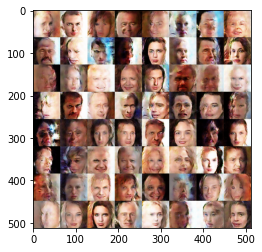

[Epoch 17]: : 1580it [07:20,  6.40it/s, g_loss=0.00472, d_loss=0.0154]Exception ignored in: <function Executor.__del__ at 0x7f6fd2d32ca0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.8/dist-packages/tensorflow/python/eager/executor.py", line 46, in __del__
    self.wait()
  File "/usr/local/lib/python3.8/dist-packages/tensorflow/python/eager/executor.py", line 65, in wait
    pywrap_tfe.TFE_ExecutorWaitForAllPendingNodes(self._handle)
tensorflow.python.framework.errors_impl.OutOfRangeError: End of sequence
[Epoch 17]: : 1582it [07:20,  3.59it/s, g_loss=0.00472, d_loss=0.0154]


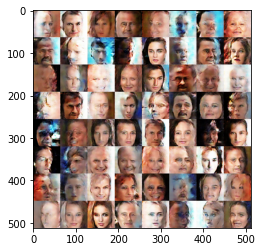

[Epoch 18]: : 1581it [09:24, 13.67it/s, g_loss=0.0123, d_loss=0.0217]Exception ignored in: <function Executor.__del__ at 0x7f6fd2d32ca0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.8/dist-packages/tensorflow/python/eager/executor.py", line 46, in __del__
    self.wait()
  File "/usr/local/lib/python3.8/dist-packages/tensorflow/python/eager/executor.py", line 65, in wait
    pywrap_tfe.TFE_ExecutorWaitForAllPendingNodes(self._handle)
tensorflow.python.framework.errors_impl.OutOfRangeError: End of sequence
[Epoch 18]: : 1582it [09:24,  2.80it/s, g_loss=0.0123, d_loss=0.0217]


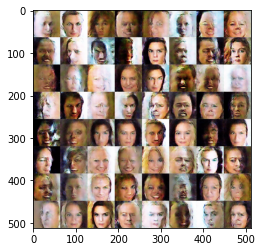

[Epoch 19]: : 1580it [08:13,  8.88it/s, g_loss=0.00167, d_loss=0.00431]Exception ignored in: <function Executor.__del__ at 0x7f6fd2d32ca0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.8/dist-packages/tensorflow/python/eager/executor.py", line 46, in __del__
    self.wait()
  File "/usr/local/lib/python3.8/dist-packages/tensorflow/python/eager/executor.py", line 65, in wait
    pywrap_tfe.TFE_ExecutorWaitForAllPendingNodes(self._handle)
tensorflow.python.framework.errors_impl.OutOfRangeError: End of sequence
[Epoch 19]: : 1582it [08:13,  3.20it/s, g_loss=0.00167, d_loss=0.00431]


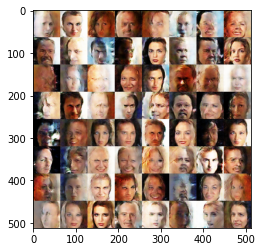

[Epoch 20]: : 1580it [04:34, 11.73it/s, g_loss=0.0344, d_loss=0.0117]Exception ignored in: <function Executor.__del__ at 0x7f6fd2d32ca0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.8/dist-packages/tensorflow/python/eager/executor.py", line 46, in __del__
    self.wait()
  File "/usr/local/lib/python3.8/dist-packages/tensorflow/python/eager/executor.py", line 65, in wait
    pywrap_tfe.TFE_ExecutorWaitForAllPendingNodes(self._handle)
tensorflow.python.framework.errors_impl.OutOfRangeError: End of sequence
[Epoch 20]: : 1582it [04:34,  5.76it/s, g_loss=0.0344, d_loss=0.0117]


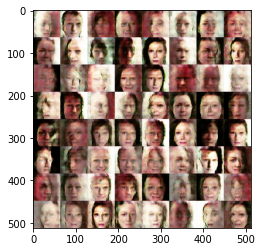

[Epoch 21]: : 1580it [05:15,  2.82it/s, g_loss=0.00573, d_loss=0.00878]Exception ignored in: <function Executor.__del__ at 0x7f6fd2d32ca0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.8/dist-packages/tensorflow/python/eager/executor.py", line 46, in __del__
    self.wait()
  File "/usr/local/lib/python3.8/dist-packages/tensorflow/python/eager/executor.py", line 65, in wait
    pywrap_tfe.TFE_ExecutorWaitForAllPendingNodes(self._handle)
tensorflow.python.framework.errors_impl.OutOfRangeError: End of sequence
[Epoch 21]: : 1582it [05:15,  5.01it/s, g_loss=0.00573, d_loss=0.00878]


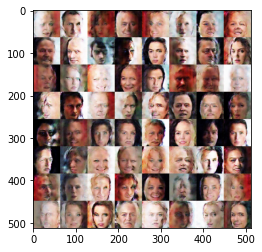

[Epoch 22]: : 1581it [06:48,  2.45it/s, g_loss=0.00372, d_loss=0.00611] Exception ignored in: <function Executor.__del__ at 0x7f6fd2d32ca0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.8/dist-packages/tensorflow/python/eager/executor.py", line 46, in __del__
    self.wait()
  File "/usr/local/lib/python3.8/dist-packages/tensorflow/python/eager/executor.py", line 65, in wait
    pywrap_tfe.TFE_ExecutorWaitForAllPendingNodes(self._handle)
tensorflow.python.framework.errors_impl.OutOfRangeError: End of sequence
[Epoch 22]: : 1582it [06:49,  3.87it/s, g_loss=0.00372, d_loss=0.00611]


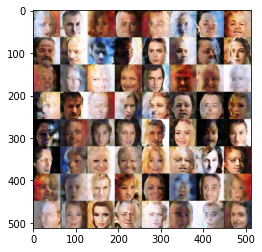

[Epoch 23]: : 1582it [05:58,  4.30it/s, g_loss=0.00284, d_loss=0.00691]Exception ignored in: <function Executor.__del__ at 0x7f6fd2d32ca0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.8/dist-packages/tensorflow/python/eager/executor.py", line 46, in __del__
    self.wait()
  File "/usr/local/lib/python3.8/dist-packages/tensorflow/python/eager/executor.py", line 65, in wait
    pywrap_tfe.TFE_ExecutorWaitForAllPendingNodes(self._handle)
tensorflow.python.framework.errors_impl.OutOfRangeError: End of sequence
[Epoch 23]: : 1582it [05:58,  4.42it/s, g_loss=0.00284, d_loss=0.00691]


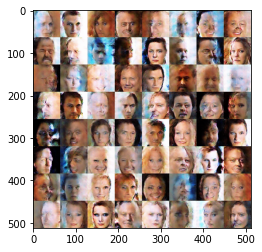

[Epoch 24]: : 1580it [06:10, 18.91it/s, g_loss=0.00672, d_loss=0.00132]Exception ignored in: <function Executor.__del__ at 0x7f6fd2d32ca0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.8/dist-packages/tensorflow/python/eager/executor.py", line 46, in __del__
    self.wait()
  File "/usr/local/lib/python3.8/dist-packages/tensorflow/python/eager/executor.py", line 65, in wait
    pywrap_tfe.TFE_ExecutorWaitForAllPendingNodes(self._handle)
tensorflow.python.framework.errors_impl.OutOfRangeError: End of sequence
[Epoch 24]: : 1582it [06:11,  4.26it/s, g_loss=0.00672, d_loss=0.00132]


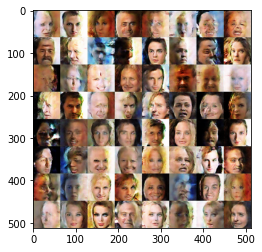

[Epoch 25]: : 1581it [05:50, 11.94it/s, g_loss=0.000427, d_loss=0.0106]Exception ignored in: <function Executor.__del__ at 0x7f6fd2d32ca0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.8/dist-packages/tensorflow/python/eager/executor.py", line 46, in __del__
    self.wait()
  File "/usr/local/lib/python3.8/dist-packages/tensorflow/python/eager/executor.py", line 65, in wait
    pywrap_tfe.TFE_ExecutorWaitForAllPendingNodes(self._handle)
tensorflow.python.framework.errors_impl.OutOfRangeError: End of sequence
[Epoch 25]: : 1582it [05:50,  4.51it/s, g_loss=0.000427, d_loss=0.0106]


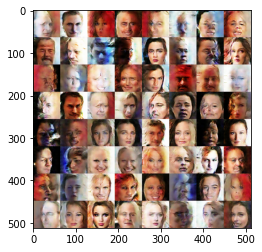

[Epoch 26]: : 1579it [06:45, 14.39it/s, g_loss=0.0082, d_loss=0.00426] Exception ignored in: <function Executor.__del__ at 0x7f6fd2d32ca0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.8/dist-packages/tensorflow/python/eager/executor.py", line 46, in __del__
    self.wait()
  File "/usr/local/lib/python3.8/dist-packages/tensorflow/python/eager/executor.py", line 65, in wait
    pywrap_tfe.TFE_ExecutorWaitForAllPendingNodes(self._handle)
tensorflow.python.framework.errors_impl.OutOfRangeError: End of sequence
[Epoch 26]: : 1582it [06:45,  3.90it/s, g_loss=0.0082, d_loss=0.00426]


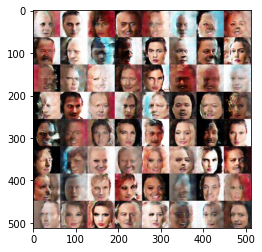

[Epoch 27]: : 1581it [08:11, 11.21it/s, g_loss=0.00378, d_loss=0.0205] Exception ignored in: <function Executor.__del__ at 0x7f6fd2d32ca0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.8/dist-packages/tensorflow/python/eager/executor.py", line 46, in __del__
    self.wait()
  File "/usr/local/lib/python3.8/dist-packages/tensorflow/python/eager/executor.py", line 65, in wait
    pywrap_tfe.TFE_ExecutorWaitForAllPendingNodes(self._handle)
tensorflow.python.framework.errors_impl.OutOfRangeError: End of sequence
[Epoch 27]: : 1582it [08:12,  3.22it/s, g_loss=0.00378, d_loss=0.0205]


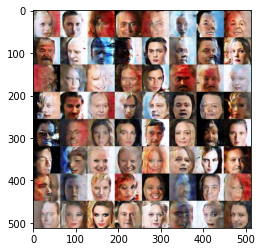

[Epoch 28]: : 1582it [09:29, 14.05it/s, g_loss=0.0107, d_loss=0.0568]Exception ignored in: <function Executor.__del__ at 0x7f6fd2d32ca0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.8/dist-packages/tensorflow/python/eager/executor.py", line 46, in __del__
    self.wait()
  File "/usr/local/lib/python3.8/dist-packages/tensorflow/python/eager/executor.py", line 65, in wait
    pywrap_tfe.TFE_ExecutorWaitForAllPendingNodes(self._handle)
tensorflow.python.framework.errors_impl.OutOfRangeError: End of sequence
[Epoch 28]: : 1582it [09:29,  2.78it/s, g_loss=0.0107, d_loss=0.0568]


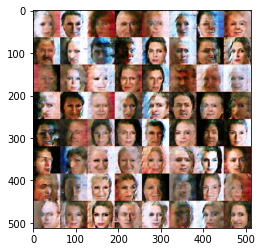

[Epoch 29]: : 1582it [10:03,  5.04it/s, g_loss=0.00169, d_loss=0.0069]Exception ignored in: <function Executor.__del__ at 0x7f6fd2d32ca0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.8/dist-packages/tensorflow/python/eager/executor.py", line 46, in __del__
    self.wait()
  File "/usr/local/lib/python3.8/dist-packages/tensorflow/python/eager/executor.py", line 65, in wait
    pywrap_tfe.TFE_ExecutorWaitForAllPendingNodes(self._handle)
tensorflow.python.framework.errors_impl.OutOfRangeError: End of sequence
[Epoch 29]: : 1582it [10:03,  2.62it/s, g_loss=0.00169, d_loss=0.0069]


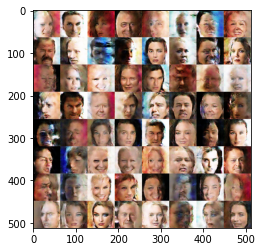

In [ ]:
# this will start the training loop. We set the number of epochs but feel free to revise it. From initial runs, it takes around 50 seconds to complete 1 epoch
# we've setup a progress bar to display the losses per epoch and there is code as well to print the fake images generated

# generate a batch of noisy input
test_z = tf.random.normal(shape=(64, 1, 1, z_dim))

# start loop
for epoch in range(30): 
    with tqdm(dataset) as pbar:
        pbar.set_description(f"[Epoch {epoch}]")
        for step, (X1, X2) in enumerate(pbar):
            # train on the current batch
            d_loss, g_loss, fake = train_on_batch(X1, X2)

            # display the losses
            pbar.set_postfix({"g_loss": g_loss.numpy(), "d_loss": d_loss.numpy()})
    
        # generate fake images
        fake_img = model_G(test_z)

    # save output
    if not os.path.exists(out_dir):
        os.makedirs(out_dir)
    file_path = out_dir+f"/epoch_{epoch:04}.png"
    save_img(fake_img.numpy()[:64], file_path, 8)
    
    # display gallery of fake faces
    if epoch % 1 == 0:
        with Image.open(file_path) as img:
            plt.imshow(np.asarray(img))
            plt.show()

In [ ]:
# display the galleries as an animation.

imgs = os.listdir('celeba_out')
imgs.sort()
imgs = [cv2.imread('celeba_out/' + i) for i in imgs]
imgs = [cv2.cvtColor(i, cv2.COLOR_BGR2RGB) for i in imgs]
imageio.mimsave('gan-celebface-anim.gif', imgs, fps=2)

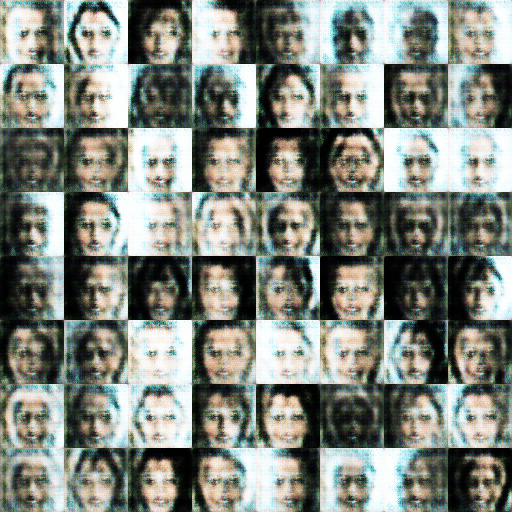

In [ ]:
path="gan-celebface-anim.gif"

with open(path,'rb') as f:
    display(IpyImage(data=f.read(), format='png'))

## Example 6. A GAN with Hands.

We will build a GAN that generates pictures of hands. These will be trained on a dataset of hand images doing sign language.

In [ ]:
import tensorflow as tf
import tensorflow.keras as keras

import matplotlib.pyplot as plt
import numpy as np

import urllib.request
import zipfile
from IPython import display

In [ ]:
# utility
def plot_results(images, n_cols=None):
    '''visualizes fake images'''
    display.clear_output(wait=False)  
    
    n_cols = n_cols or len(images)
    n_rows = (len(images) - 1) // n_cols + 1
    
    if images.shape[-1] == 1:
        images = np.squeeze(images, axis=-1)
    
    plt.figure(figsize=(n_cols, n_rows))
    
    for index, image in enumerate(images):
        plt.subplot(n_rows, n_cols, index + 1)
        plt.imshow(image, cmap="binary")
        plt.axis("off")

Get the training data.

In [ ]:
# download the dataset
training_url = "https://storage.googleapis.com/laurencemoroney-blog.appspot.com/Resources/signs-training.zip"
training_file_name = "signs-training.zip"
urllib.request.urlretrieve(training_url, training_file_name)

# extract to local directory
training_dir = "/tmp"
zip_ref = zipfile.ZipFile(training_file_name, 'r')
zip_ref.extractall(training_dir)
zip_ref.close()

Preprocess the images.

In [ ]:
BATCH_SIZE = 32

# mapping function for preprocessing the image files
def map_images(file):
  '''converts the images to floats and normalizes the pixel values'''
  img = tf.io.decode_png(tf.io.read_file(file))
  img = tf.dtypes.cast(img, tf.float32)
  img = img / 255.0
  
  return img

# create training batches
filename_dataset = tf.data.Dataset.list_files("/tmp/signs-training/*.png")
image_dataset = filename_dataset.map(map_images).batch(BATCH_SIZE)

Build the model.

In [ ]:
random_normal_dimensions = 32

# define the generator
generator = keras.models.Sequential([
    keras.layers.Dense(7*7*128, input_shape=[random_normal_dimensions]),
    keras.layers.Reshape(target_shape=[7, 7, 128]),
    keras.layers.BatchNormalization(),
    keras.layers.Conv2DTranspose(64, kernel_size=5, strides=2, padding="SAME", activation="selu"),
    keras.layers.BatchNormalization(),
    keras.layers.Conv2DTranspose(1, kernel_size=5, strides=2, padding="SAME", activation="tanh"),
])

# define the discriminator
discriminator = keras.models.Sequential([
    keras.layers.Conv2D(64, kernel_size=5, strides=2, padding="SAME"),
    keras.layers.LeakyReLU(alpha=0.2),
    keras.layers.Dropout(rate=0.4),
    keras.layers.Conv2D(128, kernel_size=5, strides=2, padding="SAME"),
    keras.layers.LeakyReLU(alpha=0.2),
    keras.layers.Dropout(rate=0.4),
    keras.layers.Flatten(),
    keras.layers.Dense(1, activation="sigmoid")
])

# compile the discriminator
discriminator.compile(loss="binary_crossentropy", optimizer="rmsprop")
discriminator.trainable = False

# build and compile the GAN model
gan = keras.models.Sequential([generator, discriminator])
gan.compile(loss="binary_crossentropy", optimizer="rmsprop")

Train the model.

In [ ]:
def train_gan(gan, dataset, random_normal_dimensions, n_epochs=50):
    """ Defines the two-phase training loop of the GAN
    Args:
      gan -- the GAN model which has the generator and discriminator
      dataset -- the training set of real images
      random_normal_dimensions -- dimensionality of the input to the generator
      n_epochs -- number of epochs
    """

    # get the two sub networks from the GAN model
    generator, discriminator = gan.layers
    
    for epoch in range(n_epochs):
        print("Epoch {}/{}".format(epoch + 1, n_epochs))       
        for real_images in dataset:
            
            # infer batch size from the current batch of real images
            real_batch_size = real_images.shape[0]
            
            # Train the discriminator - PHASE 1
            # Create the noise
            noise = tf.random.normal(shape=[real_batch_size, random_normal_dimensions])
            
            # Use the noise to generate fake images
            fake_images = generator(noise)
            
            # Create a list by concatenating the fake images with the real ones
            mixed_images = tf.concat([fake_images, real_images], axis=0)
            
            # Create the labels for the discriminator
            # 0 for the fake images
            # 1 for the real images
            discriminator_labels = tf.constant([[0.]] * real_batch_size + [[1.]] * real_batch_size)
            
            # Ensure that the discriminator is trainable
            discriminator.trainable = True
            
            # Use train_on_batch to train the discriminator with the mixed images and the discriminator labels
            discriminator.train_on_batch(mixed_images, discriminator_labels)
            
            # Train the generator - PHASE 2
            # create a batch of noise input to feed to the GAN
            noise = tf.random.normal([real_batch_size, random_normal_dimensions])
            
            # label all generated images to be "real"
            generator_labels = tf.constant([[1.]]* real_batch_size)
            
            # Freeze the discriminator
            discriminator.trainable = False

            # Train the GAN on the noise with the labels all set to be true
            gan.train_on_batch(noise, generator_labels)

        plot_results(fake_images, 16)                     
        plt.show()
    return fake_images

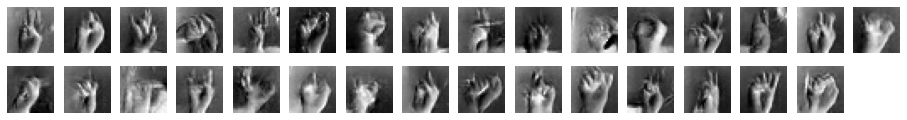

In [ ]:
# the number of epochs
EPOCHS = 100

# run the training loop and collect images
fake_images = train_gan(gan, image_dataset, random_normal_dimensions, EPOCHS)